# **1. PROJECT BRIEF**

## 1.1. Business problem

A bike-sharing service provider aspires to understand the demand for shared bikes among the people after this ongoing quarantine situation ends across the nation due to Covid-19. They have planned this to prepare themselves to cater to the people's needs once the situation gets better all around and stand out from other service providers and make huge profits.

The company wants to know:

1.   Which variables are significant in predicting the demand for shared bikes.
2.   How well those variables describe the bike demands

The information available is on the rental profile and weather patterns based on which the above understandings need to be developed.

## 1.2. Analytics goal and business use

The purpose of this analyses is to model the demand for shared bikes with the available independent variables so that it can be used by the management to understand how exactly the demands vary with different features. With this, they can accordingly manipulate the business strategy to meet the demand levels and meet the customer's expectations. Further, the model will be a good way for management to understand the demand dynamics of a new market. 

## 1.3. Analysis strategy



1.   Provide a description of the weather variables and the rental profile over periods.
2.   Predict the future scenario based on the provided information.
3.   Prescribe variables and model to predict bike demands.


# **2. Understanding and Preparation of Data**


## 2.1. Import necessary libraries and data

In [1]:
#check python version
!python --version

Python 3.7.13


In [2]:
#stop warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
#import necessary libraries
from IPython.display import Image
import requests
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
import statsmodels.api as sm  
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score
import math
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [4]:
#load data
dataset = pd.read_csv("https://ml-course2-upgrad.s3.amazonaws.com/Linear+Regression+Assignment/Bike+Sharing+Assignment/day.csv")

## 2.2. Overview of the dataset

In [5]:
print("The first five records:")
dataset.head(5)

The first five records:


,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [6]:
print("The dataset contains", dataset.shape[0], "records and", dataset.shape[1], "columns")

The dataset contains 730 records and 16 columns


In [7]:
#check the variables, entries, null values, and variable types
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


In [8]:
print("The number of unique values per column:")
dataset.nunique()

The number of unique values per column:


instant       730
dteday        730
season          4
yr              2
mnth           12
holiday         2
weekday         7
workingday      2
weathersit      3
temp          498
atemp         689
hum           594
windspeed     649
casual        605
registered    678
cnt           695
dtype: int64

In [9]:
print("The column names in the provided dataset:")
dataset.columns

The column names in the provided dataset:


Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [10]:
print("The unique values for day, month, season variables:")
print("day:", dataset.weekday.unique())
print("month:", dataset.mnth.unique())
print("season:", dataset.season.unique())

The unique values for day, month, season variables:
day: [6 0 1 2 3 4 5]
month: [ 1  2  3  4  5  6  7  8  9 10 11 12]
season: [1 2 3 4]


In [11]:
print("The number of duplicate records in the dataset:", dataset.duplicated().sum())

The number of duplicate records in the dataset: 0


The dependent variable in the dataset is the count of total rental bikes, given by "cnt". As per the data dictionary, this variable is a sum of the count of casual users, given by "casual", and count of registered users, given by "registered".

The categorical variable in the dataset are:

season
year
month
holiday
weekday
workingday
weather situation

From the above it is evident that multiple columns are in formats which are inappropriate for describing the dataset. The initial preparation of the dataset before performing the EDA, will include the following:

1. Drop redundant columns: instant
2. Transform columns to appropriate type: 
i. transform date column to datetype
ii. transform season, mnth, weekday, weathersit into object type. For day names it will be needed to create day numbers from 1-7 replacing 0-6.

While the yr and workingday are inappropriately typed as numerical data, I will not change the datatype of these variables since only two classes are there in each.

The dataset does not contain any null value.
The dataset does not contain any duplicate records.

Among the day variables, there are multiple variables which infer closely related information, such as holiday, workingday, and weekday. If the weekday is a Sunday or a Saturday, it is also a holiday and noon-workingday. Therefore, from the weekday column I will derive weekends and also remove redundant columns.

## 2.3. Initial dataset preparation

In [12]:
# Drop instant column
df = dataset.drop('instant', axis = 1)

In [13]:
# Transform dteday to Datetime format
df['dteday'] = df['dteday'].map(lambda x: datetime.strptime(x, '%d-%m-%Y')) 

In [14]:
# Transform season to categorical variable
season_dict = {1: 'spring', 2: 'summer', 3: 'fall', 4: 'winter'}
df = df.replace({'season': season_dict})

In [15]:
# Transform mnth to categorical variable
df['mnth'] = df['mnth'].map(lambda x: datetime.strftime(datetime.strptime(str(x), "%m"), '%B'))

In [16]:
# Transform weekday to categorical variable
weekday_dict = {0: 'Sunday', 1: 'Monday', 2: 'Tuesday', 3: 'Wednessday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday'}
df = df.replace({"weekday": weekday_dict})

In [17]:
# Trabsform weathersit to categorical variable
weather_dict = {1: 'pattern_1', 2: 'pattern_2', 3: 'pattern_3', 4: 'pattern_4'}
df = df.replace({"weathersit": weather_dict})

In [18]:
# Transform yr to categorical variable
yr_dict ={0: '2018', 1: '2019'}
df = df.replace({'yr': yr_dict})

In [19]:
# Transform holiday to categorical variable
holiday_dict= {0: 'not_holiday', 1: 'holiday'}
df = df.replace({'holiday': holiday_dict})

In [20]:
# Transform workingday to categorical variable
workingday_dict = {0: 'nonworkingday', 1: 'workingday'}
df = df.replace({'workingday': workingday_dict})

## 2.4. Exploratory data analysis

2.4.1. Describe data

In [21]:
#analyze numerical columns
df.describe()

,temp,atemp,hum,windspeed,casual,registered,cnt
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,20.319259,23.726322,62.765175,12.763620,849.249315,3658.757534,4508.006849
std,7.506729,8.150308,14.237589,5.195841,686.479875,1559.758728,1936.011647
min,2.424346,3.953480,0.000000,1.500244,2.000000,20.000000,22.000000
25%,13.811885,16.889713,52.000000,9.041650,316.250000,2502.250000,3169.750000
50%,20.465826,24.368225,62.625000,12.125325,717.000000,3664.500000,4548.500000
75%,26.880615,30.445775,72.989575,15.625589,1096.500000,4783.250000,5966.000000
max,35.328347,42.044800,97.250000,34.000021,3410.000000,6946.000000,8714.000000


In [22]:
#analyze object columns
df.describe(include = "object")

,season,yr,mnth,holiday,weekday,workingday,weathersit
count,730,730,730,730,730,730,730
unique,4,2,12,2,7,2,3
top,fall,2018,January,not_holiday,Saturday,workingday,pattern_1
freq,188,365,62,709,105,499,463


For all the weather variables (temperature, apparent temperature, humidity, windspeed) mean and median are overlapping.

For the only categorical weather variable, weather situation, I found that in most of the days in a year the weather was of pattern 1, that is Clear, Few clouds, or Partly cloudy.

***The dependent variable (count of bike rentals) has two components– casual and registered and their distribution is probably different. Casual rental has mean>median and registered rental has almost similar mean and median. In addition, as the count of registered rental bikes are way more than casual rental bikes, there is a risk that using them together can mask the casual rental count pattern and render higher inaccuracy in the model. It will be therefore wise approach to create two separate regression models (one with casual as dependent variable and the other with registered as dependent variable) and then assess the accuracy after summing up the predictions and comparing with total counts.***

### 2.4.2. Derive columns from primary columns

In [23]:
# Create a function that takes in row values of weekday and checks if it is a Saturday or Sunday and if so, returns weekend
def weekend_create(row):  
    if row['weekday'] == "Sunday":
        return 'Weekend'
    elif row['weekday'] == "Saturday":
        return 'Weekend'
    return 'Weekday'

In [24]:
df["weekend"] = df.apply(lambda row: weekend_create(row), axis=1)

### 2.4.3. Visualize dependent variables

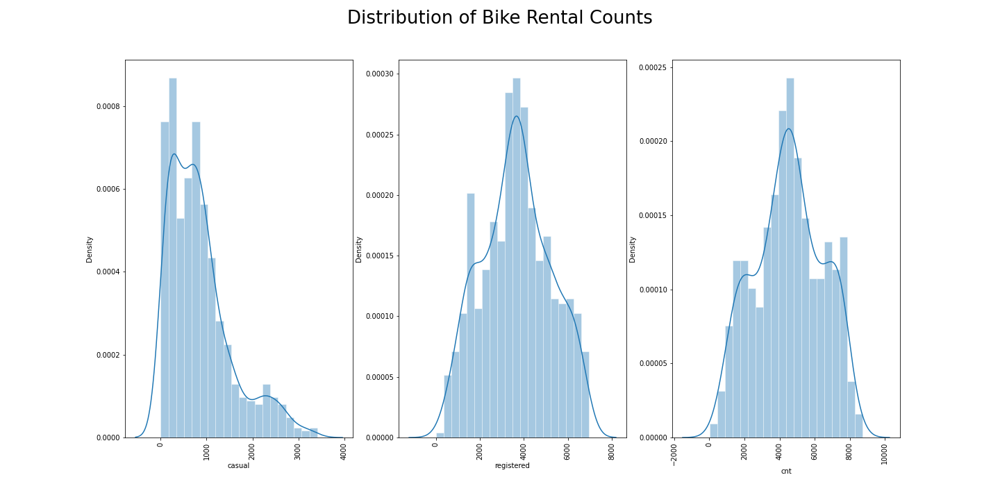

<Figure size 1440x720 with 0 Axes>

In [25]:
dep_col = ['casual', 'registered', 'cnt']
fig, ax = plt.subplots(1, 3, figsize=(20, 10))
fig.suptitle('Distribution of Bike Rental Counts', fontsize=26)
sns.set_style("whitegrid")
for variable, subplot in zip(dep_col, ax.flatten()):
    sns.distplot(df[variable], bins = 20, ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)
fig.savefig("distplot.png")
plt.clf() 
Image(filename='distplot.png') 

It is evident from the above that the distribution of casual and registered rentals are different and registered rental distribution masks the casual rental distribution.

In [26]:
#measure skewness (I will also check the acceptable skewness level as per Hair et al. (2010) and Bryne (2010), i.e. whether less than -2 or more than +2)
skewness = df[dep_col].skew(axis = 0).to_frame("Skewness")
skewness

,Skewness
casual,1.266328
registered,0.041211
cnt,-0.049581


As skewness is positive and less than 2 for casual rental counts, and negative and more than -2 for registered rental counts, linear regression can be done without any treatment.

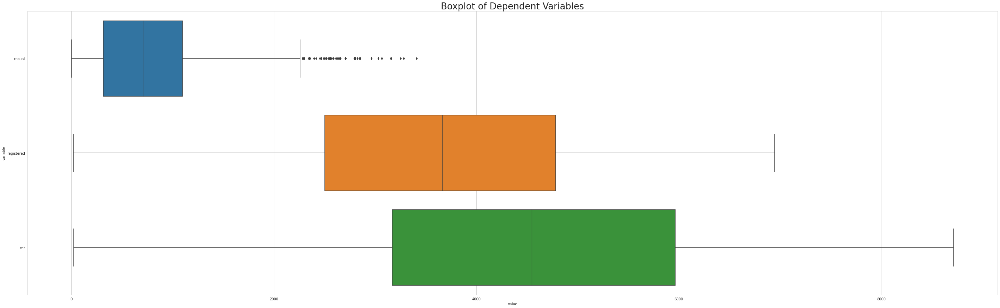

In [27]:
#create boxplot for dependent columns to check outliers
figsize = (50, 15)
plt.figure(figsize=figsize)

plt.title('Boxplot of Dependent Variables', fontsize=26)
df_quant = df[dep_col]
df_melted = pd.melt(df_quant)
sns.boxplot(x='value', y='variable', orient="h", data=df_melted);

Outliers can affect linear regression and I will remove outliers from training set when modeling for the casual rentals.

### 2.4.4. Visualize distribution of numerical features

In [28]:
# creating a list of numerical columns present in the subset 
num_col = df.select_dtypes(exclude=['object', 'datetime']).columns.to_list() 
len(num_col)

7

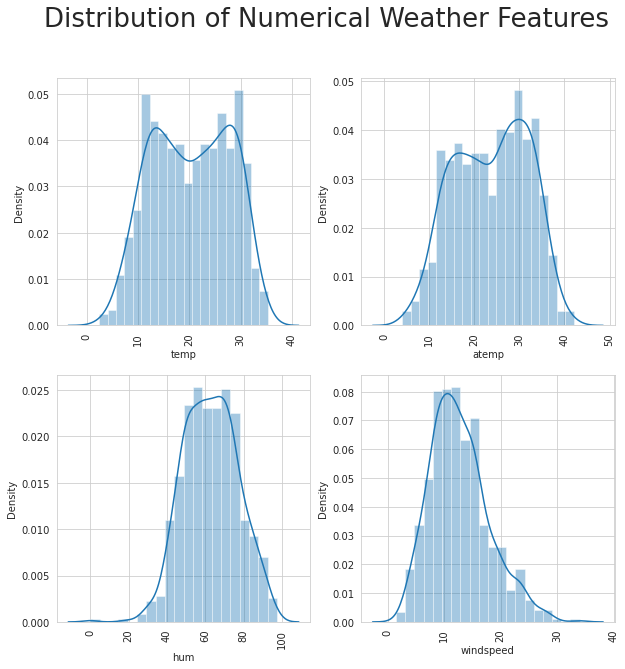

In [29]:
# Plotting the distribution of numerical weather features in the dataframe
num_col = ['temp', 'atemp', 'hum', 'windspeed']
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Distribution of Numerical Weather Features', fontsize=26)
sns.set_style("whitegrid")
for variable, subplot in zip(num_col, ax.flatten()):
    sns.distplot(df[variable], bins = 20, ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90);

### 2.4.5. Visualize categorical features

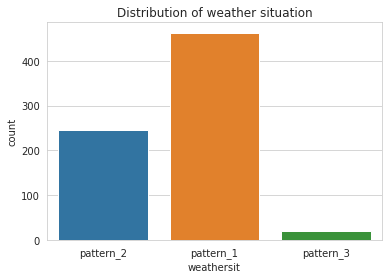

In [30]:
# distribution of categorical weather features
sns.countplot(x="weathersit", data=df).set(title='Distribution of weather situation');

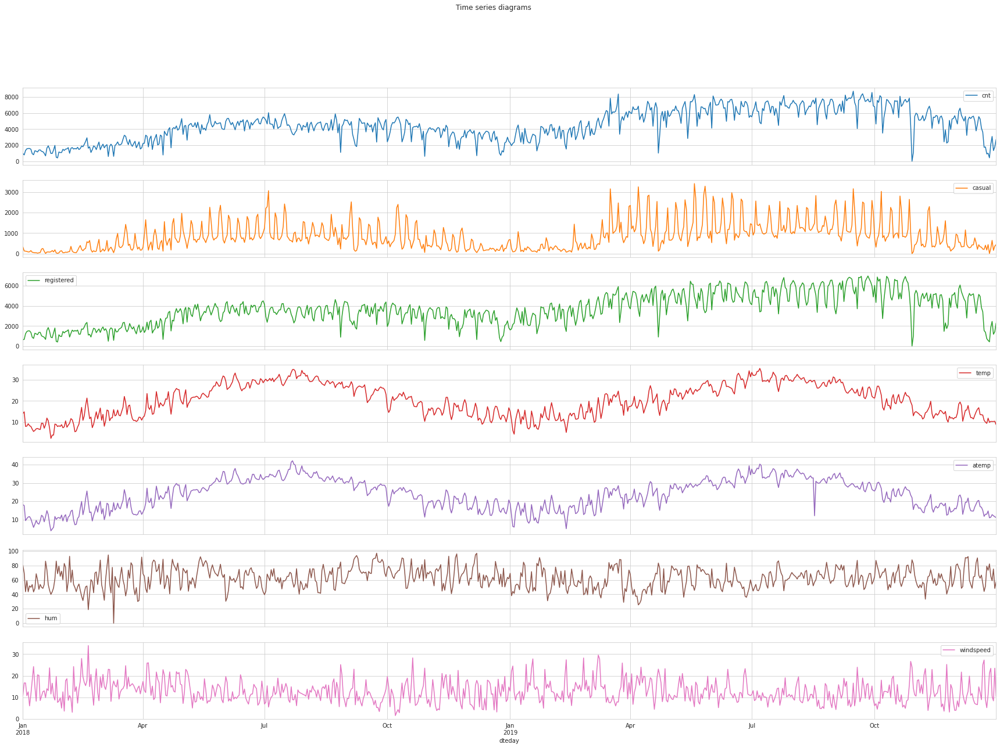

In [31]:
df_ts = df.set_index('dteday')
df_ts_subset = df_ts[['cnt', 'casual', 'registered', 'temp', 'atemp', 'hum', 'windspeed']]
ts_plot = df_ts_subset.plot(subplots=True, figsize=(30, 20), title='Time series diagrams');

One important point to note from the above is that casual rental couts probably have seasonal variations and that is possibly related to temperature variations. The registered counts also possibly have seasonal variations, but that is less apparent compared to casual counts. 

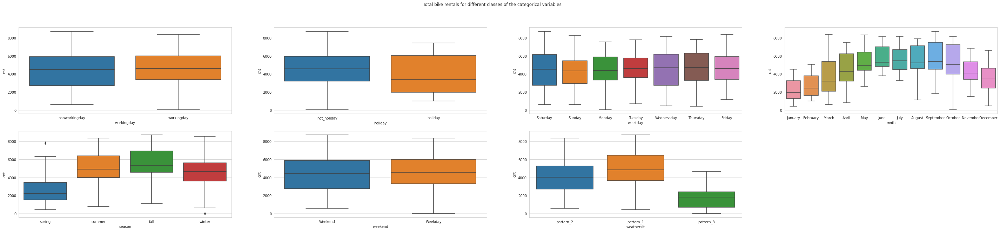

In [32]:
plt.figure(figsize=(50, 10))
plt.subplot(2,4,1)
sns.boxplot(x = 'workingday', y = 'cnt', data = df)
plt.subplot(2,4,2)
sns.boxplot(x = 'holiday', y = 'cnt', data = df)
plt.subplot(2,4,3)
sns.boxplot(x = 'weekday', y = 'cnt', data = df)
plt.subplot(2,4,4)
sns.boxplot(x = 'mnth', y = 'cnt', data = df)
plt.subplot(2,4,5)
sns.boxplot(x = 'season', y = 'cnt', data = df)
plt.subplot(2,4,6)
sns.boxplot(x = 'weekend', y = 'cnt', data = df)
plt.subplot(2,4,7)
sns.boxplot(x = 'weathersit', y = 'cnt', data = df)
plt.suptitle("Total bike rentals for different classes of the categorical variables");

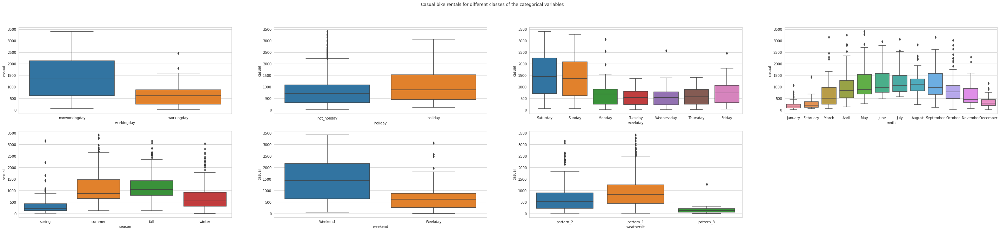

In [33]:
plt.figure(figsize=(50, 10))
plt.subplot(2,4,1)
sns.boxplot(x = 'workingday', y = 'casual', data = df)
plt.subplot(2,4,2)
sns.boxplot(x = 'holiday', y = 'casual', data = df)
plt.subplot(2,4,3)
sns.boxplot(x = 'weekday', y = 'casual', data = df)
plt.subplot(2,4,4)
sns.boxplot(x = 'mnth', y = 'casual', data = df)
plt.subplot(2,4,5)
sns.boxplot(x = 'season', y = 'casual', data = df)
plt.subplot(2,4,6)
sns.boxplot(x = 'weekend', y = 'casual', data = df)
plt.subplot(2,4,7)
sns.boxplot(x = 'weathersit', y = 'casual', data = df)
plt.suptitle("Casual bike rentals for different classes of the categorical variables");

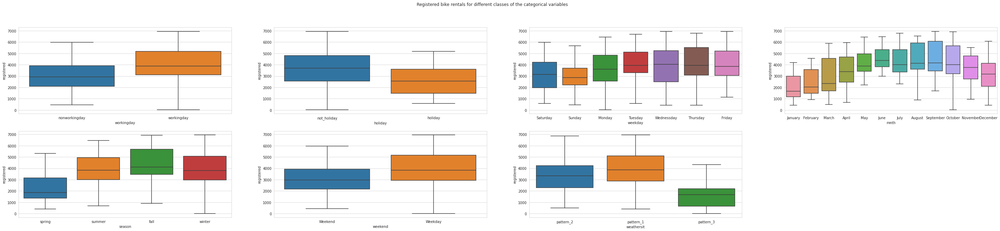

In [34]:
plt.figure(figsize=(50, 10))
plt.subplot(2,4,1)
sns.boxplot(x = 'workingday', y = 'registered', data = df)
plt.subplot(2,4,2)
sns.boxplot(x = 'holiday', y = 'registered', data = df)
plt.subplot(2,4,3)
sns.boxplot(x = 'weekday', y = 'registered', data = df)
plt.subplot(2,4,4)
sns.boxplot(x = 'mnth', y = 'registered', data = df)
plt.subplot(2,4,5)
sns.boxplot(x = 'season', y = 'registered', data = df)
plt.subplot(2,4,6)
sns.boxplot(x = 'weekend', y = 'registered', data = df)
plt.subplot(2,4,7)
sns.boxplot(x = 'weathersit', y = 'registered', data = df)
plt.suptitle("Registered bike rentals for different classes of the categorical variables");

**Critical Insights:**

1. Total rental is similar across working and non-workingdays. But, the relationship is opposite for casual and registered bikes. Casual rentals are more in non-workingdays, and registered rentals are more in workingdays.
2. Casual rentals are slightly higher in holidays and weekends and registered rentals are much higher during non-holidays.
3. Rentals in different weather patterns are similar for casual and registered rentals. However, in pattern_3, that means in poor weather casual rentals are disproportionately low.
4. Both types of rentals have seasonal variations, with higher bookings in summer and fall. But, casual rental is disproportionately low in winter and spring.

### 2.4.6. Pairgrids for different complex relationships

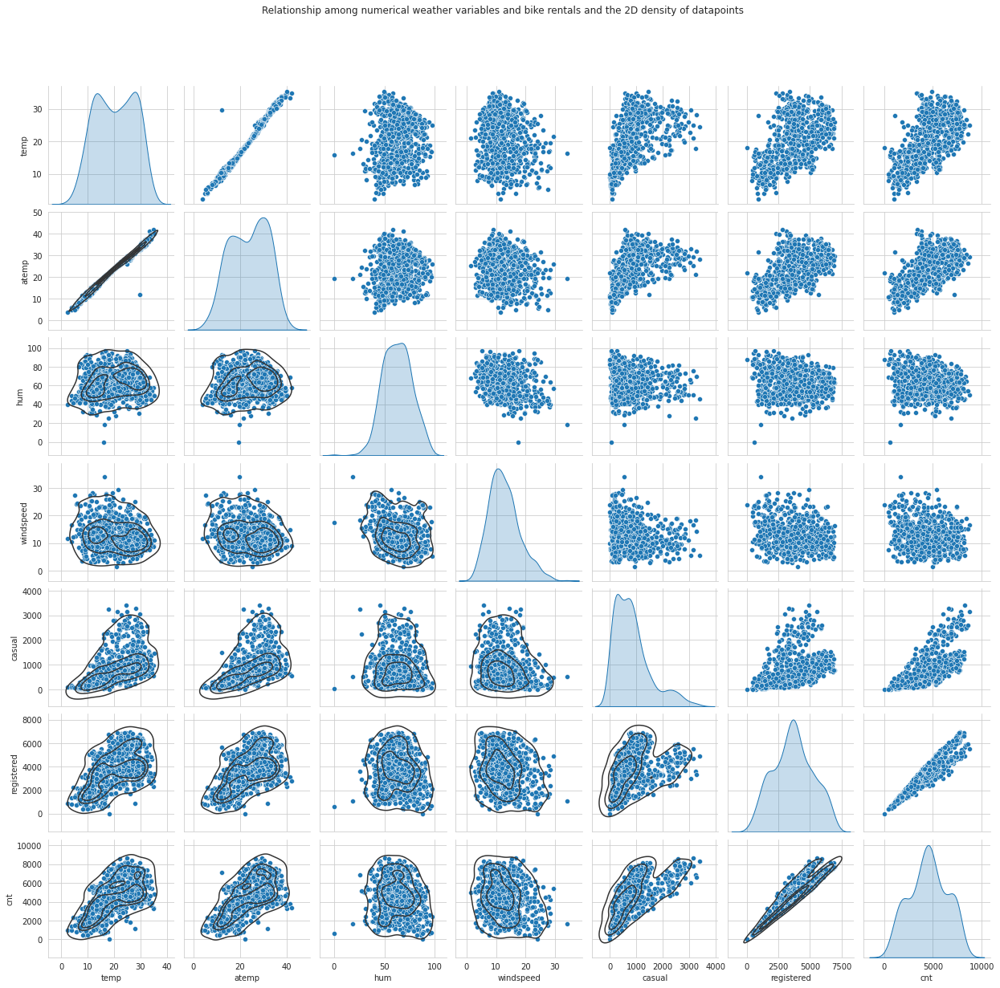

<Figure size 1260x1260 with 0 Axes>

In [35]:
g1 = sns.pairplot(df, diag_kind="kde")
g1.map_lower(sns.kdeplot, levels=4, color=".2")
g1.fig.suptitle('Relationship among numerical weather variables and bike rentals and the 2D density of datapoints')
g1.fig.subplots_adjust(top=0.9)
g1.savefig("pairplot_1.png")
plt.clf() 
Image(filename='pairplot_1.png') 

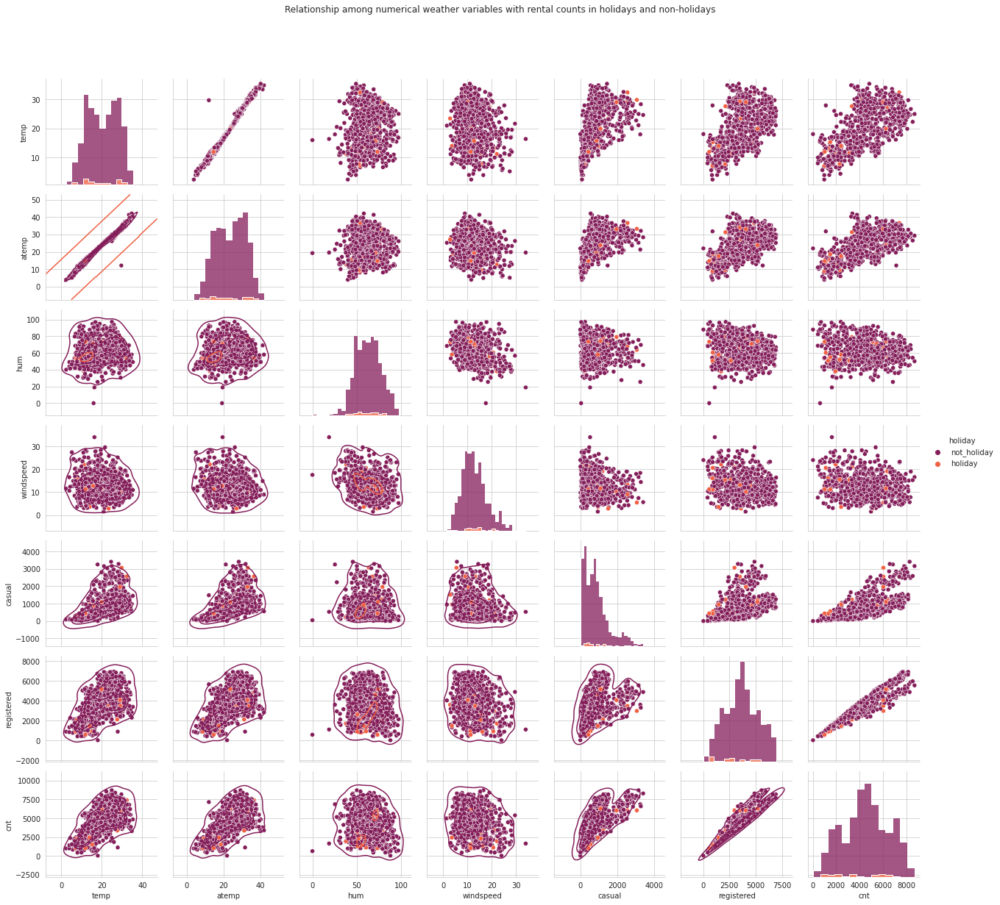

In [36]:
g2 = sns.PairGrid(df, hue='holiday', palette = "rocket")
g2.map_diag(sns.histplot, multiple="stack", element="step")
g2.map_offdiag(sns.scatterplot)
g2.map_lower(sns.kdeplot, levels=4, color=".4")
g2.fig.suptitle("Relationship among numerical weather variables with rental counts in holidays and non-holidays")
g2.fig.subplots_adjust(top=0.9)
g2.add_legend();

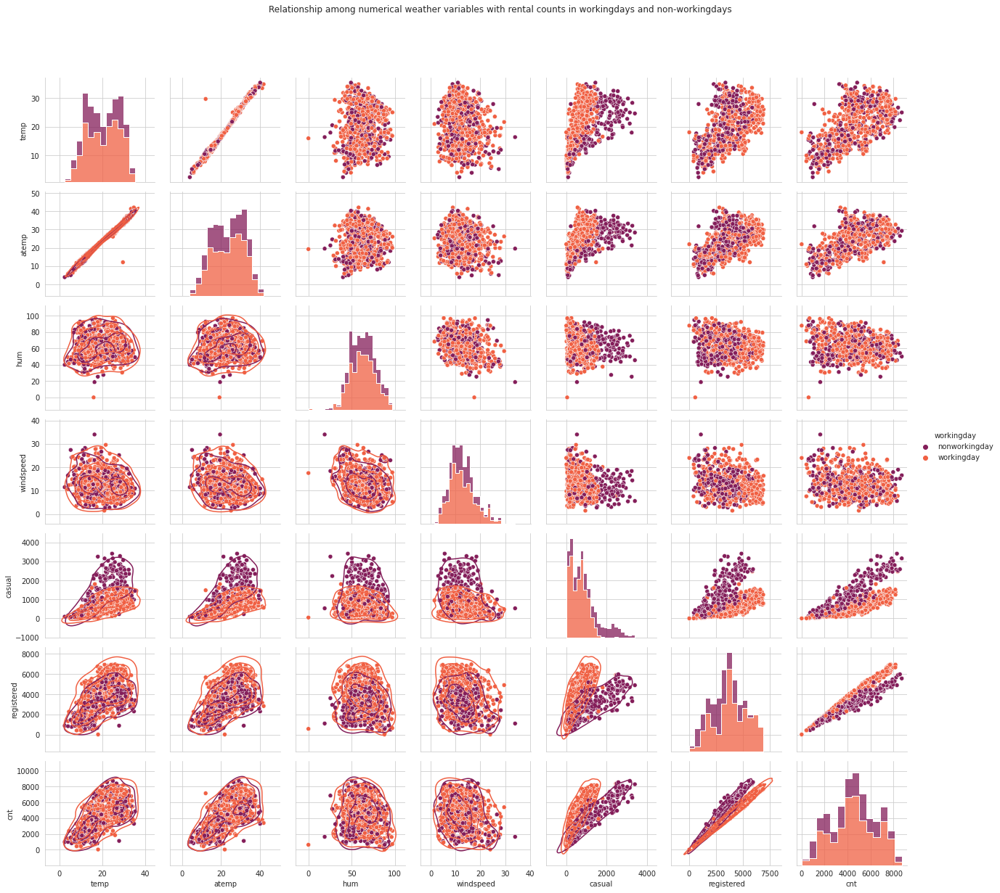

In [37]:
g3 = sns.PairGrid(df, hue='workingday', palette = "rocket")
g3.map_diag(sns.histplot, multiple="stack", element="step")
g3.map_offdiag(sns.scatterplot)
g3.map_lower(sns.kdeplot, levels=4, color=".4")
g3.fig.suptitle("Relationship among numerical weather variables with rental counts in workingdays and non-workingdays")
g3.fig.subplots_adjust(top=0.9)
g3.add_legend();

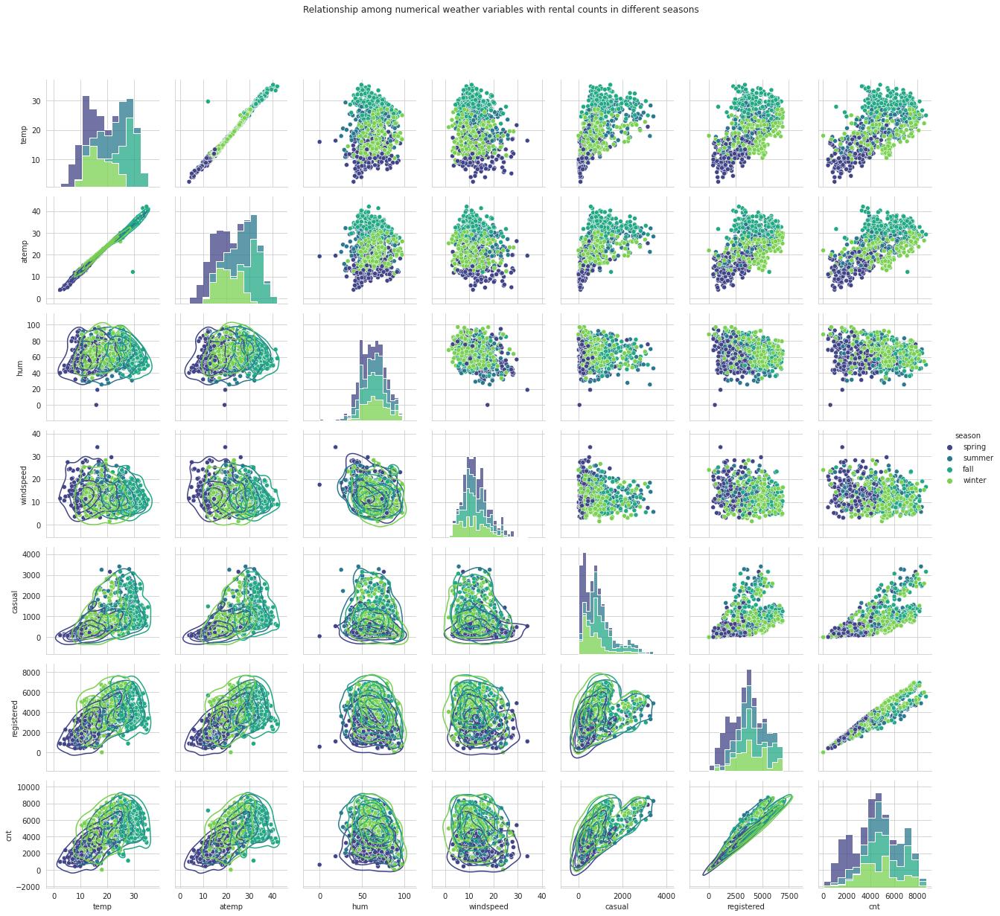

In [38]:
g4 = sns.PairGrid(df, hue='season', palette = "viridis")
g4.map_diag(sns.histplot, multiple="stack", element="step")
g4.map_offdiag(sns.scatterplot)
g4.map_lower(sns.kdeplot, levels=4, color=".4")
g4.fig.suptitle("Relationship among numerical weather variables with rental counts in different seasons")
g4.fig.subplots_adjust(top=0.9)
g4.add_legend();

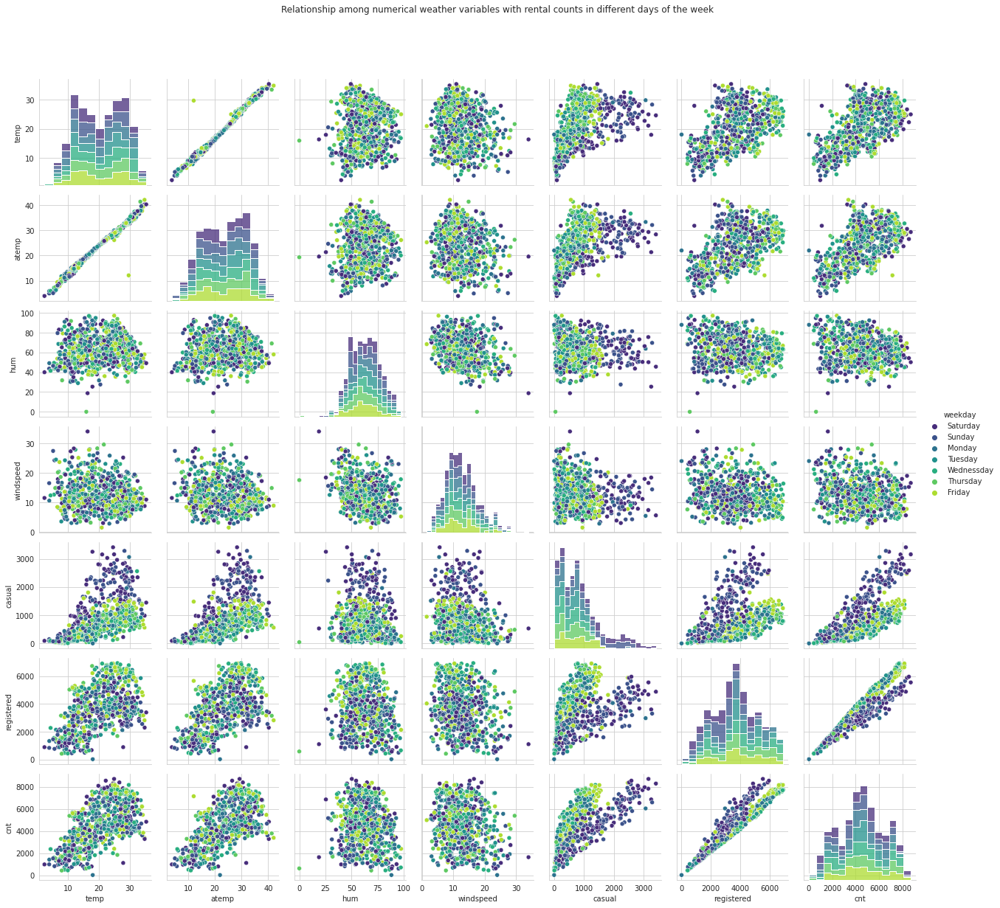

In [39]:
g5 = sns.PairGrid(df, hue='weekday', palette= "viridis")
g5.map_diag(sns.histplot, multiple="stack", element="step")
g5.map_offdiag(sns.scatterplot)
g5.fig.suptitle("Relationship among numerical weather variables with rental counts in different days of the week")
g5.fig.subplots_adjust(top=0.9)
g5.add_legend();

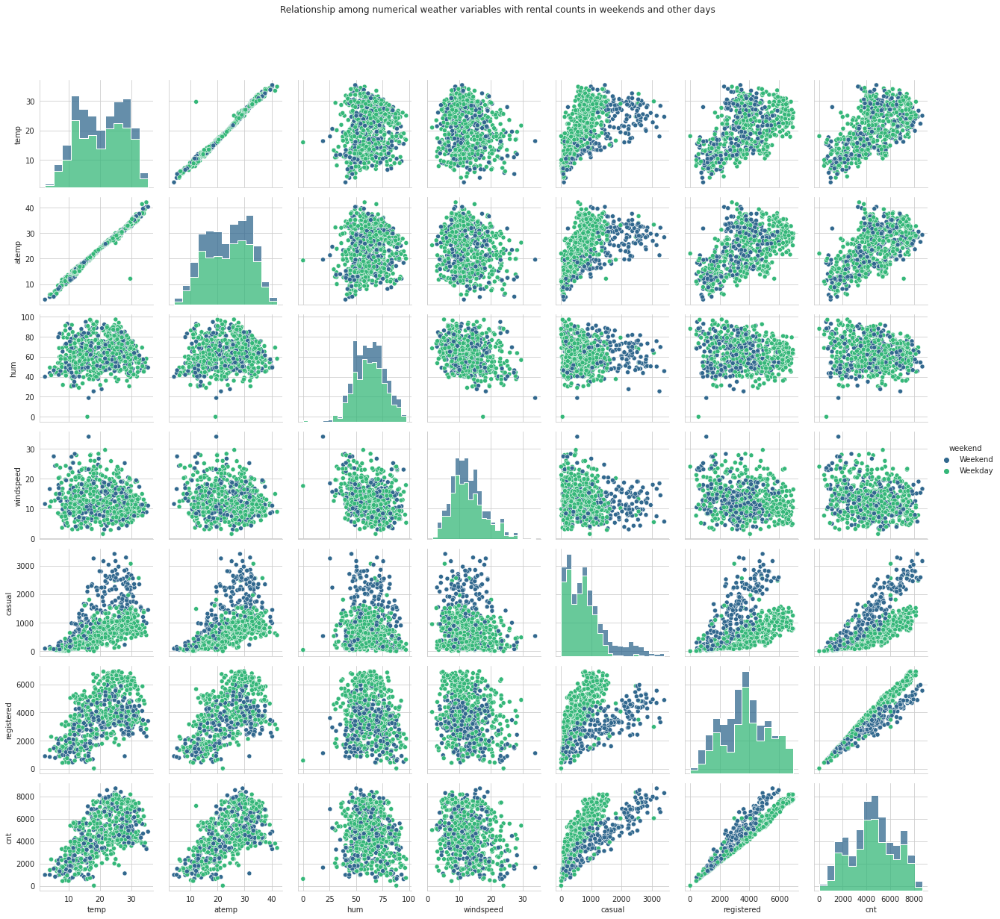

In [40]:
g6 = sns.PairGrid(df, hue='weekend', palette= "viridis")
g6.map_diag(sns.histplot, multiple="stack", element="step")
g6.map_offdiag(sns.scatterplot)
g6.fig.suptitle("Relationship among numerical weather variables with rental counts in weekends and other days")
g6.fig.subplots_adjust(top=0.9)
g6.add_legend();

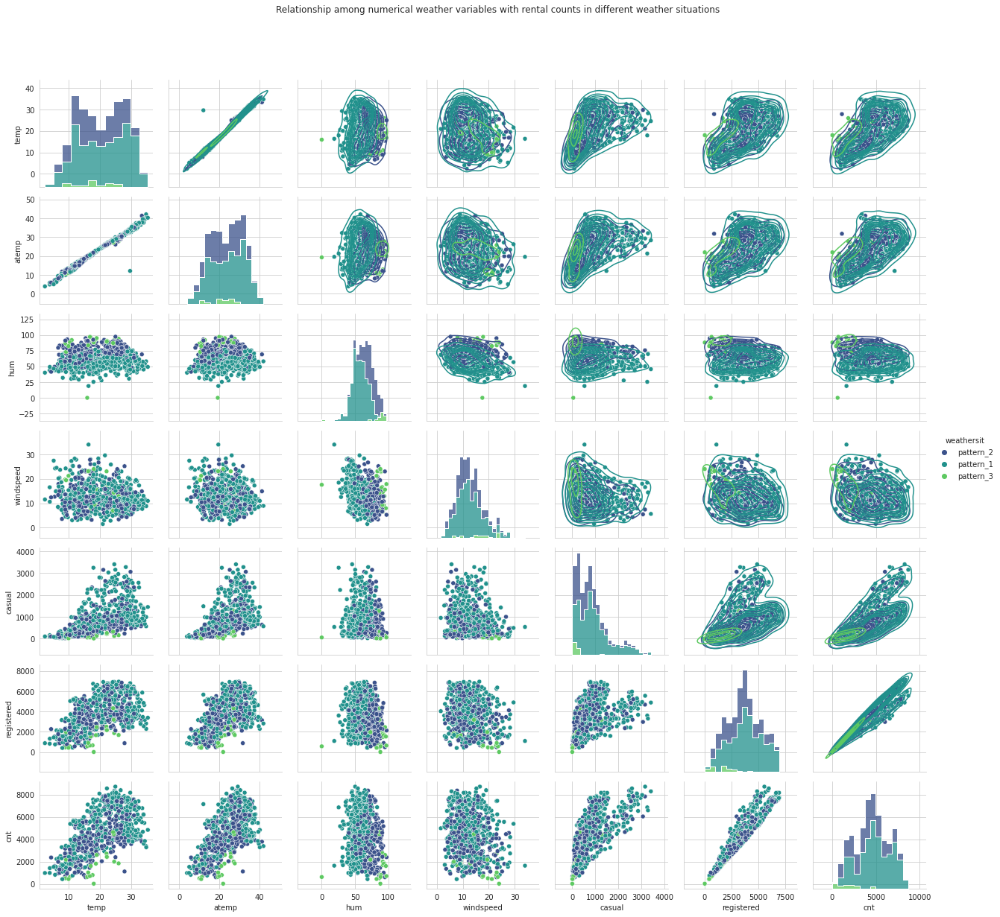

In [41]:
g7 = sns.PairGrid(df, hue='weathersit', palette= "viridis")
g7.map_diag(sns.histplot, multiple="stack", element="step")
g7.map_offdiag(sns.scatterplot)
g7.map_upper(sns.kdeplot)
g7.fig.suptitle("Relationship among numerical weather variables with rental counts in different weather situations")
g7.fig.subplots_adjust(top=0.9)
g7.add_legend();

### 2.4.7. Correlation matrices

Text(0.5, 1.0, 'Correlation of variation weather features with total rental')

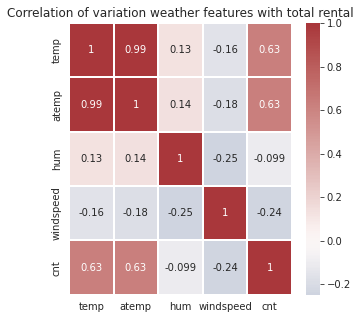

In [42]:
# Correlation detection between various numerical columns
num_col = ['temp', 'atemp', 'hum', 'windspeed', 'cnt']
plt.figure(figsize = (5,5))
ax= sns.heatmap(df[num_col].corr(), annot = True, center=0, cmap="vlag",linewidth =1)
ax.set_title("Correlation of variation weather features with total rental")

Text(0.5, 1.0, 'Correlation of variation weather features with casual rental')

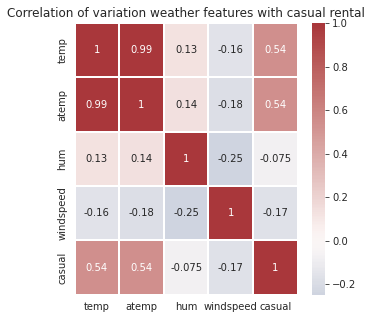

In [43]:
# Correlation detection between various numerical columns
num_col = ['temp', 'atemp', 'hum', 'windspeed', 'casual']
plt.figure(figsize = (5,5))
ax= sns.heatmap(df[num_col].corr(), annot = True, center=0, cmap="vlag",linewidth =1)
ax.set_title("Correlation of variation weather features with casual rental")

Text(0.5, 1.0, 'Correlation of variation weather features with registered rental')

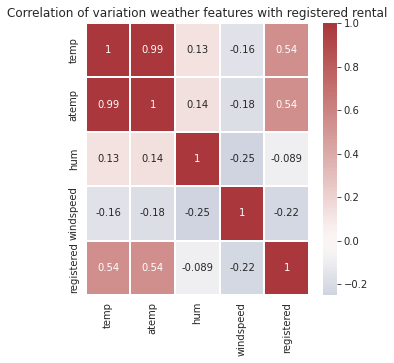

In [44]:
# Correlation detection between various numerical columns
num_col = ['temp', 'atemp', 'hum', 'windspeed', 'registered']
plt.figure(figsize = (5,5))
ax= sns.heatmap(df[num_col].corr(), annot = True, center=0, cmap="vlag",linewidth =1)
ax.set_title("Correlation of variation weather features with registered rental")

## 2.5. Data Preparation for regression


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   dteday      730 non-null    datetime64[ns]
 1   season      730 non-null    object        
 2   yr          730 non-null    object        
 3   mnth        730 non-null    object        
 4   holiday     730 non-null    object        
 5   weekday     730 non-null    object        
 6   workingday  730 non-null    object        
 7   weathersit  730 non-null    object        
 8   temp        730 non-null    float64       
 9   atemp       730 non-null    float64       
 10  hum         730 non-null    float64       
 11  windspeed   730 non-null    float64       
 12  casual      730 non-null    int64         
 13  registered  730 non-null    int64         
 14  cnt         730 non-null    int64         
 15  weekend     730 non-null    object        
dtypes: datetime64[ns](1), floa

In [46]:
df.columns

Index(['dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual',
       'registered', 'cnt', 'weekend'],
      dtype='object')

In [47]:
# drop the dateday column
df_model = df.drop("dteday", axis = 1)

In [48]:
# create dummy variables for all object columns
yr_dummy = pd.get_dummies(df_model['yr'], drop_first= True)
season_dummy = pd.get_dummies(df_model['season'], drop_first= True)
mnth_dummy= pd.get_dummies(df_model['mnth'], drop_first= True)
holiday_dummy = pd.get_dummies(df_model['holiday'], drop_first= True)
weekday_dummy = pd.get_dummies(df_model['weekday'], drop_first= True)
workingday_dummy = pd.get_dummies(df_model['workingday'], drop_first= True)
weekend_dummy = pd.get_dummies(df_model['weekend'], drop_first= True)
weathersit_dummy = pd.get_dummies(df_model['weathersit'], drop_first= True)

In [49]:
df_model = pd.concat([df_model, yr_dummy, season_dummy, mnth_dummy, holiday_dummy, weekday_dummy, workingday_dummy, weekend_dummy, weathersit_dummy], axis = 1)

In [50]:
df_model.drop(['yr', 'season', 'mnth', 'holiday', 'workingday', 'weekday', 'weathersit', 'weekend', 'Saturday', 'Sunday'], axis = 1, inplace = True)

### Train-test split

In [51]:
np.random.seed(0)
df_train, df_test = train_test_split(df_model, train_size = 0.7, test_size = 0.3, random_state = 42)

### Scaling of data

In [52]:
scaler = MinMaxScaler()
num_vars = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

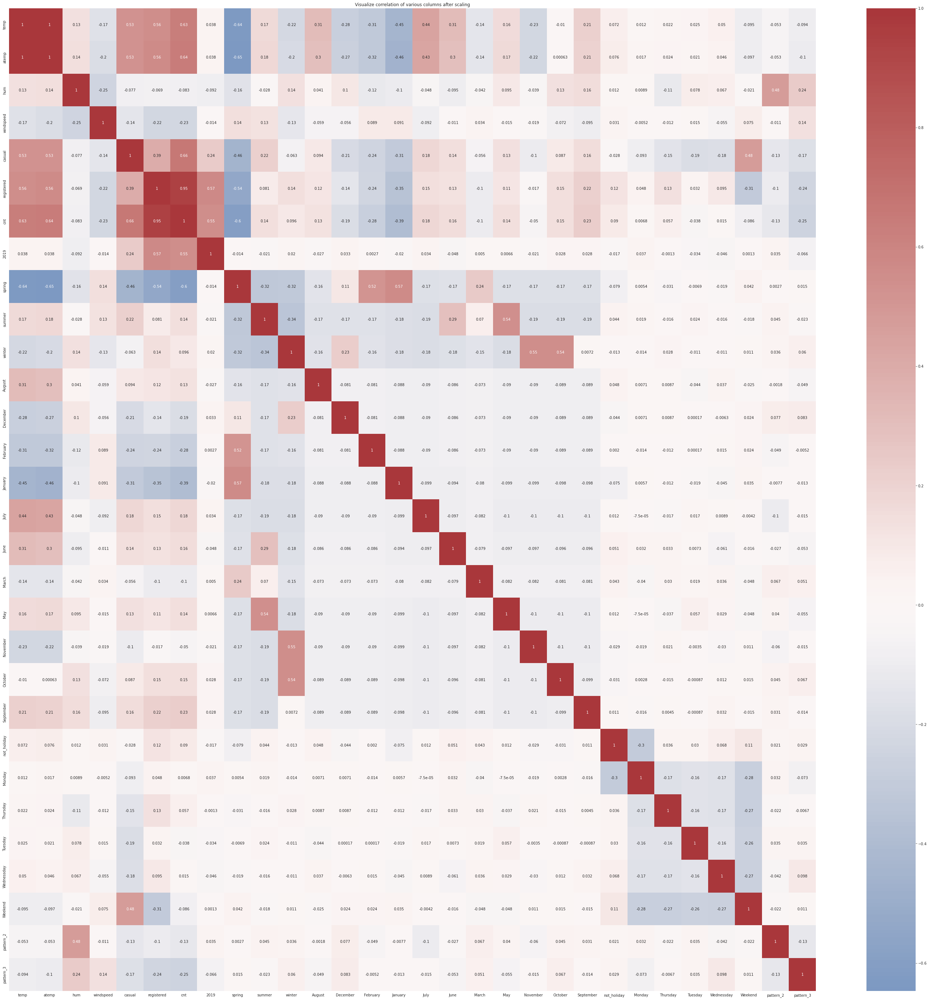

In [53]:
plt.figure(figsize = (50, 50))
sns.heatmap(df_train.corr(), cmap="vlag", center=0, annot = True).set_title("Visualize correlation of various columns after scaling");

Outlier removal

In [54]:
df_train_indep = df_train.drop(["casual", "registered", "cnt"], axis = 1)
indep_var_list = df_train_indep.columns.to_list()
lof = LocalOutlierFactor(contamination = 0.01)
df_train['lof'] = lof.fit_predict(df_train[indep_var_list])
df_train = df_train.loc[df_train['lof'] >= 0]
df_train.drop("lof", axis = 1, inplace = True)

Data set splitting and separation of targets and features

In [55]:
X_train = df_train.drop(["casual", "registered", "cnt"], axis = 1)
y_train = df_train["cnt"]
cas_train = df_train.drop(["cnt", "registered"], axis = 1)
reg_train = df_train.drop(["cnt", "casual"], axis = 1)
y_cas_train = cas_train['casual']
X_cas_train = cas_train.drop(['casual'], axis = 1)
y_reg_train = reg_train['registered']
X_reg_train = reg_train.drop(['registered'], axis = 1)

Recursive feature elimination

In [56]:
# Running RFE with the output number of the variable equal to 15
lm_total = LinearRegression()
lm_total.fit(X_train, y_train)
rfe_total = RFE(lm_total, n_features_to_select=15, step=1)
rfe_total = rfe_total.fit(X_train, y_train)

In [57]:
list(zip(X_train.columns,rfe_total.support_,rfe_total.ranking_))

[('temp', True, 1),
 ('atemp', True, 1),
 ('hum', True, 1),
 ('windspeed', True, 1),
 ('2019', True, 1),
 ('spring', True, 1),
 ('summer', False, 11),
 ('winter', True, 1),
 ('August', False, 4),
 ('December', False, 3),
 ('February', False, 8),
 ('January', False, 12),
 ('July', True, 1),
 ('June', False, 13),
 ('March', True, 1),
 ('May', True, 1),
 ('November', False, 2),
 ('October', True, 1),
 ('September', True, 1),
 ('not_holiday', True, 1),
 ('Monday', False, 7),
 ('Thursday', False, 10),
 ('Tuesday', False, 6),
 ('Wednessday', False, 9),
 ('Weekend', False, 5),
 ('pattern_2', True, 1),
 ('pattern_3', True, 1)]

In [58]:
col_total = X_train.columns[rfe_total.support_]
col_total

Index(['temp', 'atemp', 'hum', 'windspeed', '2019', 'spring', 'winter', 'July',
       'March', 'May', 'October', 'September', 'not_holiday', 'pattern_2',
       'pattern_3'],
      dtype='object')

In [59]:
# Running RFE with the output number of the variable equal to 15
lm_cas = LinearRegression()
lm_cas.fit(X_cas_train, y_cas_train)
rfe_cas = RFE(lm_cas, n_features_to_select=15, step=1)
rfe_cas = rfe_cas.fit(X_cas_train, y_cas_train)

In [60]:
list(zip(X_cas_train.columns,rfe_cas.support_,rfe_cas.ranking_))

[('temp', False, 8),
 ('atemp', True, 1),
 ('hum', True, 1),
 ('windspeed', True, 1),
 ('2019', True, 1),
 ('spring', True, 1),
 ('summer', False, 9),
 ('winter', False, 12),
 ('August', True, 1),
 ('December', True, 1),
 ('February', True, 1),
 ('January', True, 1),
 ('July', True, 1),
 ('June', True, 1),
 ('March', False, 7),
 ('May', False, 13),
 ('November', True, 1),
 ('October', False, 10),
 ('September', False, 11),
 ('not_holiday', True, 1),
 ('Monday', False, 5),
 ('Thursday', False, 4),
 ('Tuesday', False, 3),
 ('Wednessday', False, 2),
 ('Weekend', True, 1),
 ('pattern_2', False, 6),
 ('pattern_3', True, 1)]

In [61]:
col_cas = X_cas_train.columns[rfe_cas.support_]
col_cas

Index(['atemp', 'hum', 'windspeed', '2019', 'spring', 'August', 'December',
       'February', 'January', 'July', 'June', 'November', 'not_holiday',
       'Weekend', 'pattern_3'],
      dtype='object')

In [62]:
# Running RFE with the output number of the variable equal to 15
lm_reg = LinearRegression()
lm_reg.fit(X_reg_train, y_reg_train)
rfe_reg = RFE(lm_reg, n_features_to_select=15, step=1)
rfe_reg = rfe_reg.fit(X_reg_train, y_reg_train)

In [63]:
list(zip(X_reg_train.columns,rfe_reg.support_,rfe_reg.ranking_))

[('temp', False, 7),
 ('atemp', True, 1),
 ('hum', True, 1),
 ('windspeed', True, 1),
 ('2019', True, 1),
 ('spring', True, 1),
 ('summer', False, 11),
 ('winter', True, 1),
 ('August', False, 2),
 ('December', False, 10),
 ('February', False, 4),
 ('January', False, 5),
 ('July', False, 9),
 ('June', True, 1),
 ('March', True, 1),
 ('May', True, 1),
 ('November', False, 3),
 ('October', True, 1),
 ('September', True, 1),
 ('not_holiday', True, 1),
 ('Monday', False, 12),
 ('Thursday', False, 8),
 ('Tuesday', False, 13),
 ('Wednessday', False, 6),
 ('Weekend', True, 1),
 ('pattern_2', True, 1),
 ('pattern_3', True, 1)]

In [64]:
col_reg = X_reg_train.columns[rfe_reg.support_]
col_reg

Index(['atemp', 'hum', 'windspeed', '2019', 'spring', 'winter', 'June',
       'March', 'May', 'October', 'September', 'not_holiday', 'Weekend',
       'pattern_2', 'pattern_3'],
      dtype='object')

# **3. Model Building, refinement, and evaluation**

In [65]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col_total]
X_cas_train_rfe = X_cas_train[col_cas]
X_reg_train_rfe = X_reg_train[col_reg]

In [66]:
# Adding a constant variable 
X_train_rfe = sm.add_constant(X_train_rfe)
X_cas_train_rfe = sm.add_constant(X_cas_train_rfe)
X_reg_train_rfe = sm.add_constant(X_reg_train_rfe)

In [67]:
lm_total = sm.OLS(y_train,X_train_rfe).fit()
lm_cas = sm.OLS(y_cas_train,X_cas_train_rfe).fit()
lm_reg = sm.OLS(y_reg_train,X_reg_train_rfe).fit()   

In [68]:
print(lm_total.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     171.3
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          2.25e-183
Time:                        15:08:24   Log-Likelihood:                 485.69
No. Observations:                 504   AIC:                            -939.4
Df Residuals:                     488   BIC:                            -871.8
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.2349      0.046      5.126      

In [69]:
print(lm_cas.summary())

                            OLS Regression Results                            
Dep. Variable:                 casual   R-squared:                       0.727
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                     86.57
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          7.52e-127
Time:                        15:08:24   Log-Likelihood:                 410.48
No. Observations:                 504   AIC:                            -789.0
Df Residuals:                     488   BIC:                            -721.4
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.3053      0.052      5.885      

In [70]:
print(lm_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             registered   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     178.0
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          8.88e-187
Time:                        15:08:24   Log-Likelihood:                 478.56
No. Observations:                 504   AIC:                            -925.1
Df Residuals:                     488   BIC:                            -857.6
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1803      0.046      3.882      

## VIF Analysis, model refinement, and evaluation of total count model

---



Total count models

In [71]:
# drop atemp from cas model as atemp is insignificant in presence of other variables
X_train_new = X_train_rfe.drop(["temp"], axis = 1)
X_train_lm = sm.add_constant(X_train_new)
lm_total_2 = sm.OLS(y_train,X_train_lm).fit()
print(lm_total_2.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     183.9
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          1.72e-184
Time:                        15:08:24   Log-Likelihood:                 485.63
No. Observations:                 504   AIC:                            -941.3
Df Residuals:                     489   BIC:                            -877.9
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.2348      0.046      5.130      

In [72]:
X_train_new = X_train_new.drop(['const'], axis=1)

In [73]:
# Calculate the VIFs for the new model

vif_total = pd.DataFrame()
X = X_train_new
vif_total['Features'] = X.columns
vif_total['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_total['VIF'] = round(vif_total['VIF'], 2)
vif_total = vif_total.sort_values(by = "VIF", ascending = False)
vif_total

,Features,VIF
1,hum,34.09
11,not_holiday,28.01
0,atemp,21.90
2,windspeed,5.80
4,spring,3.36
5,winter,3.22
12,pattern_2,2.33
3,2019,2.12
9,October,1.71
6,July,1.57


In [74]:
X_train_new = X_train_rfe.drop(['hum', 'temp'], axis = 1)
X_train_lm = sm.add_constant(X_train_new)

In [75]:
lm_total_3 = sm.OLS(y_train,X_train_lm).fit()
print(lm_total_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.833
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     188.2
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          5.95e-181
Time:                        15:08:25   Log-Likelihood:                 474.46
No. Observations:                 504   AIC:                            -920.9
Df Residuals:                     490   BIC:                            -861.8
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1195      0.040      3.025      

In [76]:
X_train_new = X_train_new.drop(['const'], axis=1)

In [77]:
# Calculate the VIFs for the new model

vif_total = pd.DataFrame()
X = X_train_new
vif_total['Features'] = X.columns
vif_total['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_total['VIF'] = round(vif_total['VIF'], 2)
vif_total = vif_total.sort_values(by = "VIF", ascending = False)
vif_total

,Features,VIF
10,not_holiday,23.28
0,atemp,15.17
1,windspeed,5.76
4,winter,2.70
3,spring,2.68
2,2019,2.10
8,October,1.71
11,pattern_2,1.59
5,July,1.55
7,May,1.33


In [78]:
X_train_new = X_train_rfe.drop(['hum', 'not_holiday', 'temp'], axis = 1)
X_train_lm = sm.add_constant(X_train_new)

In [79]:
lm_total_4 = sm.OLS(y_train,X_train_lm).fit()
print(lm_total_4.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.829
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                     198.6
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          1.28e-179
Time:                        15:08:25   Log-Likelihood:                 468.53
No. Observations:                 504   AIC:                            -911.1
Df Residuals:                     491   BIC:                            -856.2
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2106      0.029      7.157      0.0

In [80]:
X_train_new = X_train_new.drop(['const'], axis=1)

In [81]:
# Calculate the VIFs for the new model

vif_total = pd.DataFrame()
X = X_train_new
vif_total['Features'] = X.columns
vif_total['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_total['VIF'] = round(vif_total['VIF'], 2)
vif_total = vif_total.sort_values(by = "VIF", ascending = False)
vif_total

,Features,VIF
0,atemp,5.86
1,windspeed,4.88
2,2019,2.09
4,winter,2.03
3,spring,1.75
8,October,1.65
10,pattern_2,1.56
5,July,1.54
7,May,1.32
9,September,1.31


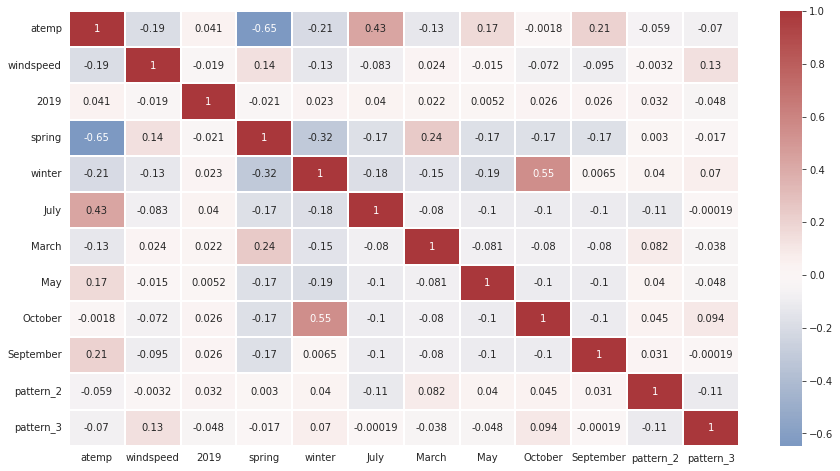

In [82]:
# Validating Multi Colinearity
plt.figure(figsize=(15,8))
sns.heatmap(X.corr(),annot = True, cmap="vlag",linewidth =1, center = 0)
plt.show()

In [83]:
X_train_new = X_train_rfe.drop(['hum', 'not_holiday', 'temp'], axis = 1)
X_train_lm = sm.add_constant(X_train_new)
lm_total_final = sm.OLS(y_train,X_train_lm).fit()
y_train_pred = lm_total_final.predict(X_train_new)

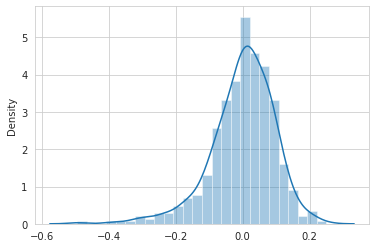

In [84]:
sns.distplot(y_train - y_train_pred)

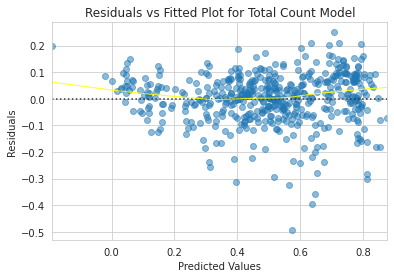

In [85]:
# Residual vs Fitted Values
lm_fitted_y = lm_total_final.fittedvalues
lm_residuals = lm_total_final.resid
lm_plot = plt.figure()
lm_plot.axes[0] = sns.residplot(lm_fitted_y, y_train,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'yellow', 'lw': 1, 'alpha': 0.9})

lm_plot.axes[0].set_title('Residuals vs Fitted Plot for Total Count Model')
lm_plot.axes[0].set_xlabel('Predicted Values')
lm_plot.axes[0].set_ylabel('Residuals');

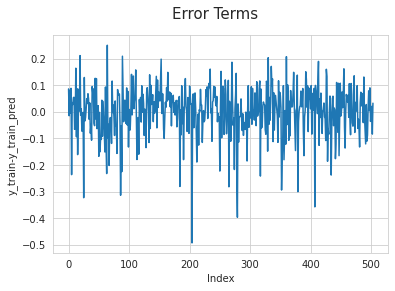

In [86]:
# Check whether Error Terms are independent of each other
c = [i for i in range(0,len(X_train),1)]
plt.plot(c,y_train-y_train_pred)
plt.suptitle('Error Terms', fontsize = 15)
plt.xlabel('Index')
plt.ylabel('y_train-y_train_pred')
plt.show()

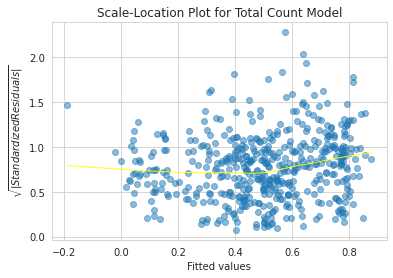

In [87]:
norm_resid = lm_total_final.get_influence().resid_studentized_internal
norm_resid_abs_sqrt = np.sqrt(np.abs(norm_resid))
abs_norm_resid = np.flip(np.argsort(np.abs(norm_resid_abs_sqrt)), 0)
abs_norm_resid_top_5 = abs_norm_resid[:5]

lm_plot_2 = plt.figure()
plt.scatter(lm_fitted_y, norm_resid_abs_sqrt, alpha=0.5);
sns.regplot(lm_fitted_y, norm_resid_abs_sqrt,
              scatter=False,
              ci=False,
              lowess=True,
              line_kws={'color': 'yellow', 'lw': 1, 'alpha': 0.9});
lm_plot_2.axes[0].set_title('Scale-Location Plot for Total Count Model')
lm_plot_2.axes[0].set_xlabel('Fitted values')
lm_plot_2.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$');

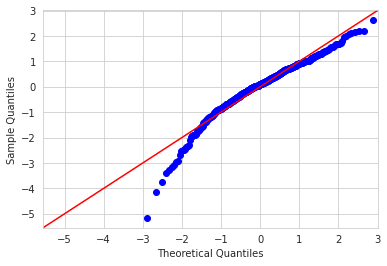

In [88]:
sm.qqplot((y_train - y_train_pred), fit=True, line='45')
plt.show()

## VIF Analysis, model refinement, and evaluation of casual count model

---

In [89]:
# all features are significant; so not dropped.
X_cas_train_new = X_cas_train_rfe
X_cas_train_lm = sm.add_constant(X_cas_train_new)
lm_cas_2 = sm.OLS(y_cas_train,X_cas_train_lm).fit()
print(lm_cas_2.summary())

                            OLS Regression Results                            
Dep. Variable:                 casual   R-squared:                       0.727
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                     86.57
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          7.52e-127
Time:                        15:08:27   Log-Likelihood:                 410.48
No. Observations:                 504   AIC:                            -789.0
Df Residuals:                     488   BIC:                            -721.4
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.3053      0.052      5.885      

In [90]:
X_cas_train_new = X_cas_train_new.drop(['const'], axis=1)

In [91]:
# Calculate the VIFs for the new model

vif_cas = pd.DataFrame()
X_cas = X_cas_train_new
vif_cas['Features'] = X_cas.columns
vif_cas['VIF'] = [variance_inflation_factor(X_cas.values, i) for i in range(X_cas.shape[1])]
vif_cas['VIF'] = round(vif_cas['VIF'], 2)
vif_cas = vif_cas.sort_values(by = "VIF", ascending = False)
vif_cas

,Features,VIF
12,not_holiday,27.88
0,atemp,27.27
1,hum,24.06
2,windspeed,5.86
4,spring,4.81
8,January,2.93
7,February,2.50
3,2019,2.13
9,July,1.82
10,June,1.53


In [92]:
X_cas_train_new = X_cas_train_rfe.drop(['not_holiday'], axis = 1)
X_cas_train_lm = sm.add_constant(X_cas_train_new)

In [93]:
lm_cas_3 = sm.OLS(y_cas_train,X_cas_train_lm).fit()
print(lm_cas_3.summary())

                            OLS Regression Results                            
Dep. Variable:                 casual   R-squared:                       0.719
Model:                            OLS   Adj. R-squared:                  0.710
Method:                 Least Squares   F-statistic:                     89.16
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          1.10e-124
Time:                        15:08:28   Log-Likelihood:                 402.92
No. Observations:                 504   AIC:                            -775.8
Df Residuals:                     489   BIC:                            -712.5
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1861      0.042      4.405      0.0

In [94]:
# Calculate the VIFs for the new model
X_cas_train_new = X_cas_train_new.drop(['const'], axis=1)
vif_cas = pd.DataFrame()
X_cas = X_cas_train_new
vif_cas['Features'] = X_cas.columns
vif_cas['VIF'] = [variance_inflation_factor(X_cas.values, i) for i in range(X_cas.shape[1])]
vif_cas['VIF'] = round(vif_cas['VIF'], 2)
vif_cas = vif_cas.sort_values(by = "VIF", ascending = False)
vif_cas

,Features,VIF
0,atemp,23.32
1,hum,19.90
2,windspeed,5.13
4,spring,4.72
8,January,2.89
7,February,2.46
3,2019,2.11
9,July,1.81
10,June,1.53
12,Weekend,1.45


In [95]:
X_cas_train_new = X_cas_train_rfe.drop(['not_holiday', 'atemp'], axis = 1)
X_cas_train_lm = sm.add_constant(X_cas_train_new)

In [96]:
lm_cas_4 = sm.OLS(y_cas_train,X_cas_train_lm).fit()
print(lm_cas_4.summary())

                            OLS Regression Results                            
Dep. Variable:                 casual   R-squared:                       0.672
Model:                            OLS   Adj. R-squared:                  0.663
Method:                 Least Squares   F-statistic:                     77.18
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          1.59e-109
Time:                        15:08:28   Log-Likelihood:                 364.27
No. Observations:                 504   AIC:                            -700.5
Df Residuals:                     490   BIC:                            -641.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4065      0.037     10.945      0.0

In [97]:
# Calculate the VIFs for the new model
X_cas_train_new = X_cas_train_new.drop(['const'], axis=1)
vif_cas = pd.DataFrame()
X_cas = X_cas_train_new
vif_cas['Features'] = X_cas.columns
vif_cas['VIF'] = [variance_inflation_factor(X_cas.values, i) for i in range(X_cas.shape[1])]
vif_cas['VIF'] = round(vif_cas['VIF'], 2)
vif_cas = vif_cas.sort_values(by = "VIF", ascending = False)
vif_cas

,Features,VIF
0,hum,5.54
1,windspeed,4.70
3,spring,4.52
7,January,2.67
6,February,2.41
2,2019,2.00
11,Weekend,1.45
5,December,1.29
10,November,1.20
8,July,1.19


Assumption check

In [98]:
y_cas_train_pred = lm_cas_4.predict(X_cas_train_lm)

Text(0.5, 0, 'Errors')

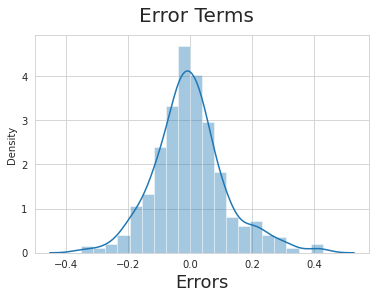

In [99]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_cas_train - y_cas_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                 
plt.xlabel('Errors', fontsize = 18)                    

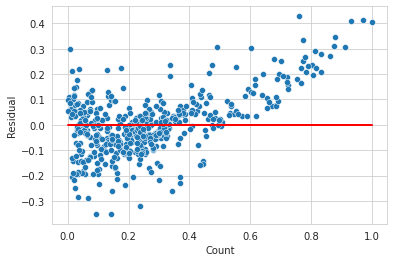

In [100]:
residual = y_cas_train - y_cas_train_pred
sns.scatterplot(y_cas_train,residual)
plt.plot(y_cas_train,(y_cas_train - y_cas_train), '-r')
plt.xlabel('Count')
plt.ylabel('Residual')
plt.show()

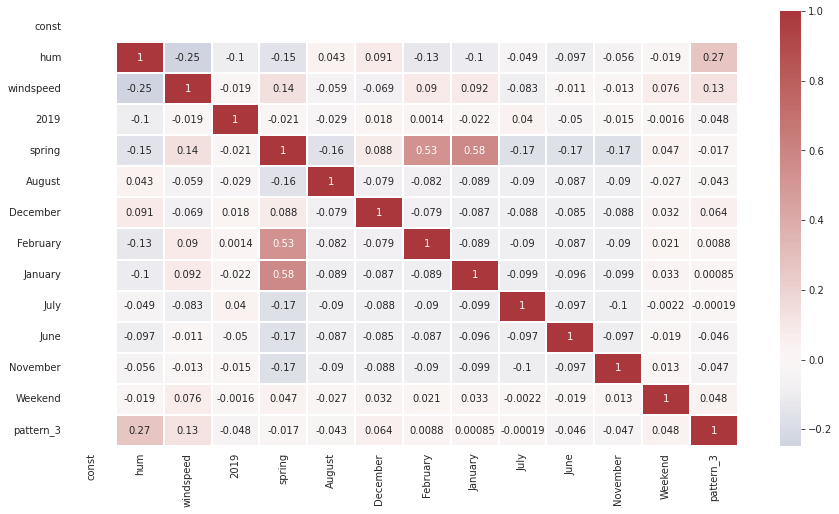

In [101]:
# Validating Multi Colinearity
plt.figure(figsize=(15,8))
sns.heatmap(X_cas_train_lm.corr(),annot = True, cmap="vlag",linewidth =1, center = 0)
plt.show()

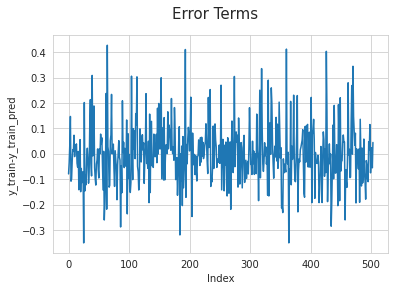

In [102]:
# Check whether Error Terms are independent of each other
c = [i for i in range(0,len(X_cas_train),1)]
plt.plot(c,y_cas_train - y_cas_train_pred)
plt.suptitle('Error Terms', fontsize = 15)
plt.xlabel('Index')
plt.ylabel('y_train-y_train_pred')
plt.show()

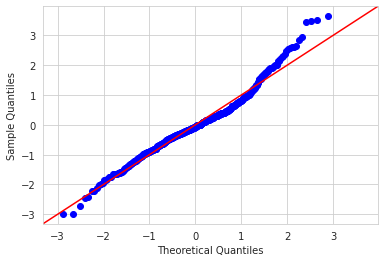

In [103]:
sm.qqplot((y_cas_train - y_cas_train_pred), fit=True, line='45')
plt.show()

## VIF Analysis, model refinement, and evaluation of registered count model

---

In [104]:
# drop atemp from cas model as atemp is insignificant in presence of other variables
X_reg_train_new = X_reg_train_rfe
X_reg_train_lm = sm.add_constant(X_reg_train_new)
lm_reg_2 = sm.OLS(y_reg_train,X_reg_train_lm).fit()
print(lm_reg_2.summary())

                            OLS Regression Results                            
Dep. Variable:             registered   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     178.0
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          8.88e-187
Time:                        15:08:30   Log-Likelihood:                 478.56
No. Observations:                 504   AIC:                            -925.1
Df Residuals:                     488   BIC:                            -857.6
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1803      0.046      3.882      

In [105]:
# Calculate the VIFs for the new model
X_reg_train_new = X_reg_train_new.drop(['const'], axis=1)
vif_reg = pd.DataFrame()
X_reg = X_reg_train_new
vif_reg['Features'] = X_reg.columns
vif_reg['VIF'] = [variance_inflation_factor(X_reg.values, i) for i in range(X_reg.shape[1])]
vif_reg['VIF'] = round(vif_reg['VIF'], 2)
vif_reg = vif_reg.sort_values(by = "VIF", ascending = False)
vif_reg

,Features,VIF
1,hum,34.10
11,not_holiday,28.75
0,atemp,20.12
2,windspeed,5.77
4,spring,3.36
5,winter,3.25
13,pattern_2,2.35
3,2019,2.13
9,October,1.70
12,Weekend,1.50


In [106]:
# drop humidity from reg model for high VIF
X_reg_train_new = X_reg_train_rfe.drop(["hum"], axis = 1)
X_reg_train_lm = sm.add_constant(X_reg_train_new)
lm_reg_3 = sm.OLS(y_reg_train,X_reg_train_lm).fit()
print(lm_reg_3.summary())

                            OLS Regression Results                            
Dep. Variable:             registered   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     185.6
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          2.51e-185
Time:                        15:08:30   Log-Likelihood:                 472.36
No. Observations:                 504   AIC:                            -914.7
Df Residuals:                     489   BIC:                            -851.4
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0924      0.039      2.343      

In [107]:
# Calculate the VIFs for the new model
X_reg_train_new = X_reg_train_new.drop(['const'], axis=1)
vif_reg = pd.DataFrame()
X_reg = X_reg_train_new
vif_reg['Features'] = X_reg.columns
vif_reg['VIF'] = [variance_inflation_factor(X_reg.values, i) for i in range(X_reg.shape[1])]
vif_reg['VIF'] = round(vif_reg['VIF'], 2)
vif_reg = vif_reg.sort_values(by = "VIF", ascending = False)
vif_reg

,Features,VIF
10,not_holiday,23.96
0,atemp,13.75
1,windspeed,5.74
4,winter,2.74
3,spring,2.71
2,2019,2.11
8,October,1.69
12,pattern_2,1.59
11,Weekend,1.50
5,June,1.35


In [108]:
# drop humidity from reg model for high VIF
X_reg_train_new = X_reg_train_rfe.drop(["hum", "not_holiday"], axis = 1)
X_reg_train_lm = sm.add_constant(X_reg_train_new)
lm_reg_4 = sm.OLS(y_reg_train,X_reg_train_lm).fit()
print(lm_reg_4.summary())

                            OLS Regression Results                            
Dep. Variable:             registered   R-squared:                       0.828
Model:                            OLS   Adj. R-squared:                  0.823
Method:                 Least Squares   F-statistic:                     181.1
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          1.32e-177
Time:                        15:08:30   Log-Likelihood:                 451.23
No. Observations:                 504   AIC:                            -874.5
Df Residuals:                     490   BIC:                            -815.3
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2651      0.031      8.688      0.0

In [109]:
# Calculate the VIFs for the new model
X_reg_train_new = X_reg_train_new.drop(['const'], axis=1)
vif_reg = pd.DataFrame()
X_reg = X_reg_train_new
vif_reg['Features'] = X_reg.columns
vif_reg['VIF'] = [variance_inflation_factor(X_reg.values, i) for i in range(X_reg.shape[1])]
vif_reg['VIF'] = round(vif_reg['VIF'], 2)
vif_reg = vif_reg.sort_values(by = "VIF", ascending = False)
vif_reg

,Features,VIF
0,atemp,5.16
1,windspeed,4.90
2,2019,2.10
4,winter,2.04
3,spring,1.79
8,October,1.64
11,pattern_2,1.55
10,Weekend,1.44
5,June,1.35
7,May,1.30


In [110]:
y_reg_train_pred = lm_reg_4.predict(X_reg_train_lm)

Text(0.5, 0, 'Errors')

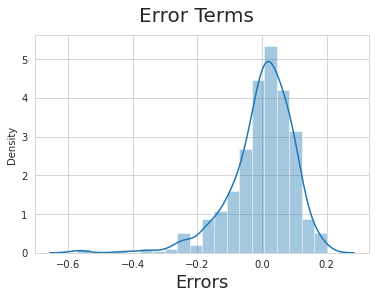

In [111]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_reg_train - y_reg_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)    

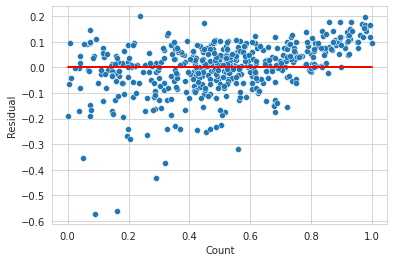

In [112]:
residual = y_reg_train - y_reg_train_pred
sns.scatterplot(y_reg_train,residual)
plt.plot(y_reg_train,(y_reg_train - y_reg_train), '-r')
plt.xlabel('Count')
plt.ylabel('Residual')
plt.show()

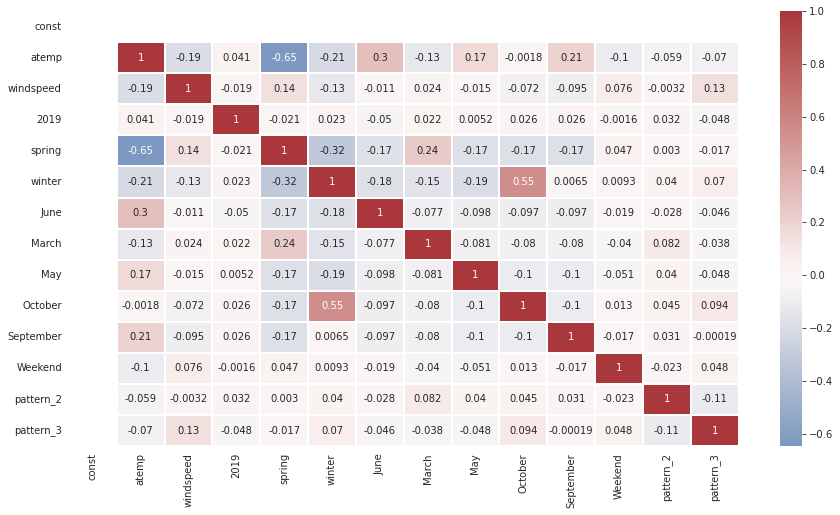

In [113]:
# Validating Multi Colinearity
plt.figure(figsize=(15,8))
sns.heatmap(X_reg_train_lm.corr(),annot = True, cmap="vlag",linewidth =1, center = 0)
plt.show()

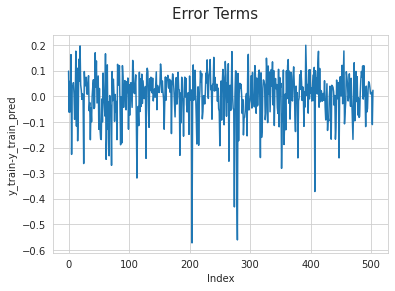

In [114]:
# Check whether Error Terms are independent of each other
c = [i for i in range(0,len(X_reg_train),1)]
plt.plot(c,y_reg_train - y_reg_train_pred)
plt.suptitle('Error Terms', fontsize = 15)
plt.xlabel('Index')
plt.ylabel('y_train-y_train_pred')
plt.show()

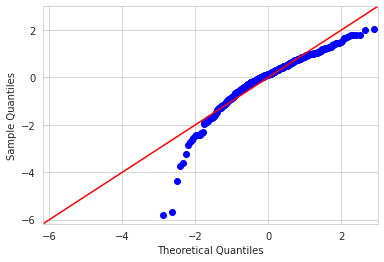

In [115]:
sm.qqplot((y_reg_train - y_reg_train_pred), fit=True, line='45')
plt.show()

# **4. Compare two models' accuracy in test set:**

*   the sum of predicted outputs from separate casual and registered count models
*   the predicted output from total count model

---



In [116]:
num_vars = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [117]:
total_test = df_test.drop(["casual", "registered"], axis = 1)
cas_test = df_test.drop(["cnt", "registered"], axis = 1)
reg_test = df_test.drop(["cnt", "casual"], axis = 1)
X_test = df_test.drop(["cnt"], axis = 1)
y_test = df_test["cnt"]
y_cas_test = cas_test['casual']
X_cas_test = cas_test.drop(['casual'], axis = 1)
y_reg_test = reg_test['registered']
X_reg_test = reg_test.drop(['registered'], axis = 1)

In [118]:
X_train_new = X_train_new.drop(['const'], axis=1)
total_col=X_train_new.columns
cas_col=X_cas_train_new.columns
reg_col=X_reg_train_new.columns
X_test=X_test[total_col]
X_cas_test=X_cas_test[cas_col]
X_reg_test=X_reg_test[reg_col]
X_test_lm_final = sm.add_constant(X_test)
X_cas_test_lm_final = sm.add_constant(X_cas_test)
X_reg_test_lm_final = sm.add_constant(X_reg_test)

In [119]:
y_pred_final = lm_total_final.predict(X_test_lm_final)
y_cas_pred_final = lm_cas_4.predict(X_cas_test_lm_final)
y_reg_pred_final = lm_reg_4.predict(X_reg_test_lm_final)

Text(0, 0.5, 'y_pred')

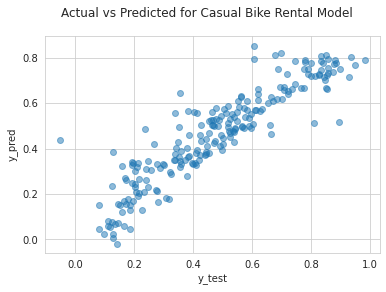

In [120]:
fig = plt.figure()
plt.scatter(y_test, y_pred_final,alpha = 0.5)
fig.suptitle('Actual vs Predicted for Casual Bike Rental Model')             
plt.xlabel('y_test')                          
plt.ylabel('y_pred') 

Text(0, 0.5, 'y_pred')

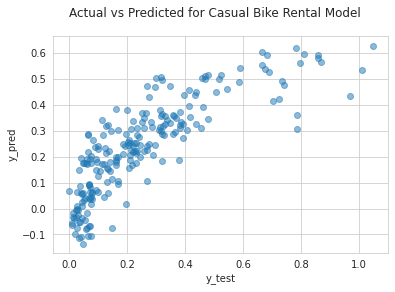

In [121]:
fig = plt.figure()
plt.scatter(y_cas_test, y_cas_pred_final,alpha = 0.5)
fig.suptitle('Actual vs Predicted for Casual Bike Rental Model')             
plt.xlabel('y_test')                          
plt.ylabel('y_pred') 

Text(0, 0.5, 'y_pred')

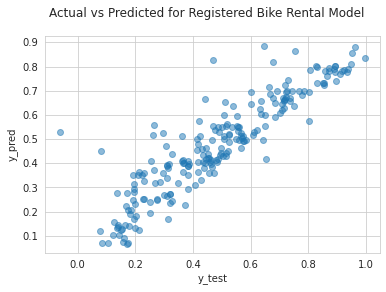

In [122]:
fig = plt.figure()
plt.scatter(y_reg_test, y_reg_pred_final,alpha = 0.5)
fig.suptitle('Actual vs Predicted for Registered Bike Rental Model')             
plt.xlabel('y_test')                          
plt.ylabel('y_pred') 

## Final Model Building from Scratch and Comparison of Results

In [123]:
df_model = df.drop("dteday", axis = 1)
yr_dummy = pd.get_dummies(df_model['yr'], drop_first= True)
season_dummy = pd.get_dummies(df_model['season'], drop_first= True)
mnth_dummy= pd.get_dummies(df_model['mnth'], drop_first= True)
holiday_dummy = pd.get_dummies(df_model['holiday'], drop_first= True)
weekday_dummy = pd.get_dummies(df_model['weekday'], drop_first= True)
weekend_dummy = pd.get_dummies(df_model['weekend'], drop_first= True)
workingday_dummy = pd.get_dummies(df_model['workingday'], drop_first= True)
weathersit_dummy = pd.get_dummies(df_model['weathersit'], drop_first= True)
df_model = pd.concat([df_model, yr_dummy, season_dummy, mnth_dummy, holiday_dummy, weekday_dummy, workingday_dummy, weekend_dummy, weathersit_dummy], axis = 1)

In [124]:
cas_col_list = cas_col.to_list()
reg_col_list = reg_col.to_list()
total_col_list = total_col.to_list()
cas_col_list.append("casual")
reg_col_list.append("registered")
total_col_list.append("cnt")

In [125]:
df_total_model = df_model[total_col_list]
df_cas_model = df_model[cas_col_list]
df_reg_model = df_model[reg_col_list]

In [126]:
df_total_model.head()

,atemp,windspeed,2019,spring,winter,July,March,May,October,September,pattern_2,pattern_3,cnt
0,18.18125,10.749882,0,1,0,0,0,0,0,0,1,0,985
1,17.68695,16.652113,0,1,0,0,0,0,0,0,1,0,801
2,9.47025,16.636703,0,1,0,0,0,0,0,0,0,0,1349
3,10.60610,10.739832,0,1,0,0,0,0,0,0,0,0,1562
4,11.46350,12.522300,0,1,0,0,0,0,0,0,0,0,1600


In [127]:
df_cas_model.head()

,hum,windspeed,2019,spring,August,December,February,January,July,June,November,Weekend,pattern_3,casual
0,80.5833,10.749882,0,1,0,0,0,1,0,0,0,1,0,331
1,69.6087,16.652113,0,1,0,0,0,1,0,0,0,1,0,131
2,43.7273,16.636703,0,1,0,0,0,1,0,0,0,0,0,120
3,59.0435,10.739832,0,1,0,0,0,1,0,0,0,0,0,108
4,43.6957,12.522300,0,1,0,0,0,1,0,0,0,0,0,82


In [128]:
df_reg_model.head()

,atemp,windspeed,2019,spring,winter,June,March,May,October,September,Weekend,pattern_2,pattern_3,registered
0,18.18125,10.749882,0,1,0,0,0,0,0,0,1,1,0,654
1,17.68695,16.652113,0,1,0,0,0,0,0,0,1,1,0,670
2,9.47025,16.636703,0,1,0,0,0,0,0,0,0,0,0,1229
3,10.60610,10.739832,0,1,0,0,0,0,0,0,0,0,0,1454
4,11.46350,12.522300,0,1,0,0,0,0,0,0,0,0,0,1518


In [129]:
np.random.seed(0)
df_total_train, df_total_test = train_test_split(df_total_model, train_size = 0.7, test_size = 0.3, random_state = 100)
df_cas_train, df_cas_test = train_test_split(df_cas_model, train_size = 0.7, test_size = 0.3, random_state = 100)
df_reg_train, df_reg_test = train_test_split(df_reg_model, train_size = 0.7, test_size = 0.3, random_state = 100)
total_scaler = MinMaxScaler()
cas_scaler = MinMaxScaler()
reg_scaler = MinMaxScaler()
total_vars = ['atemp', 'windspeed', 'cnt']
cas_vars = ['hum', 'windspeed', 'casual']
reg_vars = ['atemp', 'windspeed', 'registered']
df_total_train[total_vars] = total_scaler.fit_transform(df_total_train[total_vars])
df_cas_train[cas_vars] = cas_scaler.fit_transform(df_cas_train[cas_vars])
df_reg_train[reg_vars] = reg_scaler.fit_transform(df_reg_train[reg_vars])

In [130]:
total_indep = df_total_train.drop("cnt", axis = 1)
indep_total_var_list = total_indep.columns.to_list()

In [131]:
lof_total = LocalOutlierFactor(contamination = 0.01)
df_total_train['lof'] = lof_total.fit_predict(df_total_train[indep_total_var_list])
df_total_train = df_total_train.loc[df_total_train['lof'] >= 0]
df_total_train.drop("lof", axis = 1, inplace = True)

In [132]:
cas_indep = df_cas_train.drop("casual", axis = 1)
indep_cas_var_list = cas_indep.columns.to_list()

In [133]:
lof_cas = LocalOutlierFactor(contamination = 0.05)
df_cas_train['lof'] = lof_cas.fit_predict(df_cas_train[indep_cas_var_list])
df_cas_train = df_cas_train.loc[df_cas_train['lof'] >= 0]
df_cas_train.drop("lof", axis = 1, inplace = True)

In [134]:
reg_indep = df_reg_train.drop("registered", axis = 1)
indep_reg_var_list = reg_indep.columns.to_list()

In [135]:
lof_reg = LocalOutlierFactor(contamination = 0.01)
df_reg_train['lof'] = lof_reg.fit_predict(df_reg_train[indep_reg_var_list])
df_reg_train = df_reg_train.loc[df_reg_train['lof'] >= 0]
df_reg_train.drop("lof", axis = 1, inplace = True)

In [136]:
y_total_train = df_total_train['cnt']
X_total_train = df_total_train.drop(['cnt'], axis = 1)
y_cas_train = df_cas_train['casual']
X_cas_train = df_cas_train.drop(['casual'], axis = 1)
y_reg_train = df_reg_train['registered']
X_reg_train = df_reg_train.drop(['registered'], axis = 1)

In [137]:
X_total_train = sm.add_constant(X_total_train)
X_cas_train = sm.add_constant(X_cas_train)
X_reg_train = sm.add_constant(X_reg_train)
lm_total_final = sm.OLS(y_total_train,X_total_train).fit()
lm_cas_final = sm.OLS(y_cas_train,X_cas_train).fit()
lm_reg_final = sm.OLS(y_reg_train,X_reg_train).fit()
print(lm_total_final.summary()) 
print(lm_cas_final.summary())  
print(lm_reg_final.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     201.4
Date:                Wed, 13 Apr 2022   Prob (F-statistic):          6.94e-181
Time:                        15:08:33   Log-Likelihood:                 484.18
No. Observations:                 504   AIC:                            -942.4
Df Residuals:                     491   BIC:                            -887.5
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2554      0.025     10.109      0.0

In [138]:
df_total_test[total_vars] = total_scaler.transform(df_total_test[total_vars])
df_cas_test[cas_vars] = cas_scaler.transform(df_cas_test[cas_vars])
df_reg_test[reg_vars] = reg_scaler.transform(df_reg_test[reg_vars])
y_total_test = df_total_test['cnt']
X_total_test = df_total_test.drop(['cnt'], axis = 1)
y_cas_test = df_cas_test['casual']
X_cas_test = df_cas_test.drop(['casual'], axis = 1)
y_reg_test = df_reg_test['registered']
X_reg_test = df_reg_test.drop(['registered'], axis = 1)
X_total_test = sm.add_constant(X_total_test)
X_cas_test = sm.add_constant(X_cas_test)
X_reg_test = sm.add_constant(X_reg_test)

In [139]:
y_total_pred_final = lm_total_final.predict(X_total_test)
y_cas_pred_final = lm_cas_final.predict(X_cas_test)
y_reg_pred_final = lm_reg_final.predict(X_reg_test)

In [140]:
df_total_pred = pd.concat((X_total_test,y_total_pred_final), axis=1)
df_cas_pred = pd.concat((X_cas_test,y_cas_pred_final), axis=1)
df_reg_pred = pd.concat((X_reg_test,y_reg_pred_final), axis=1)

In [141]:
df_total_pred.drop("const", axis =1, inplace= True)
df_cas_pred.drop("const", axis =1, inplace= True)
df_reg_pred.drop("const", axis =1, inplace= True)

In [142]:
df_total_pred.columns

Index([    'atemp', 'windspeed',      '2019',    'spring',    'winter',
            'July',     'March',       'May',   'October', 'September',
       'pattern_2', 'pattern_3',           0],
      dtype='object')

In [143]:
df_total_pred.columns = ['atemp', 'windspeed',      '2019',    'spring',    'winter',
            'July',     'March',       'May',   'October', 'September',
       'pattern_2', 'pattern_3', 'cnt']

In [144]:
df_cas_pred.columns

Index([      'hum', 'windspeed',      '2019',    'spring',    'August',
        'December',  'February',   'January',      'July',      'June',
        'November',   'Weekend', 'pattern_3',           0],
      dtype='object')

In [145]:
df_cas_pred.columns = ['hum', 'windspeed',      '2019',    'spring',    'August',
        'December',  'February',   'January',      'July',      'June',
        'November',   'Weekend', 'pattern_3', 'casual']

In [146]:
df_total_pred[total_vars] = total_scaler.inverse_transform(df_total_pred[total_vars])
df_total_pred.head()

,atemp,windspeed,2019,spring,winter,July,March,May,October,September,pattern_2,pattern_3,cnt
184,33.27085,5.459106,0,0,0,1,0,0,0,0,1,0,3951.510947
535,36.04875,7.625404,1,0,0,0,0,0,0,0,0,0,7395.153421
299,22.85230,13.250121,0,0,1,0,0,0,1,0,1,0,3673.480115
221,34.24915,13.417286,0,0,0,0,0,0,0,0,0,0,4954.245098
152,32.19710,19.583229,0,0,0,0,0,0,0,0,0,0,4516.496914


In [147]:
df_total_pred.columns = ['atemp', 'windspeed',      '2019',    'spring',    'winter',
            'July',     'March',       'May',   'October', 'September',
       'pattern_2', 'pattern_3', 'cnt_pred']

In [148]:
df_cas_pred[cas_vars] = cas_scaler.inverse_transform(df_cas_pred[cas_vars])
df_cas_pred.head()

,hum,windspeed,2019,spring,August,December,February,January,July,June,November,Weekend,pattern_3,casual
184,63.7917,5.459106,0,0,0,0,0,0,1,0,0,0,0,912.059238
535,59.2083,7.625404,1,0,0,0,0,0,0,1,0,0,0,1268.220538
299,81.2917,13.250121,0,0,0,0,0,0,0,0,0,0,0,596.397934
221,42.4167,13.417286,0,0,1,0,0,0,0,0,0,0,0,849.547763
152,30.5000,19.583229,0,0,0,0,0,0,0,1,0,0,0,830.776586


In [149]:
df_cas_pred.columns = ['hum', 'windspeed',      '2019',    'spring',    'August',
        'December',  'February',   'January',      'July',      'June',
        'November',   'Weekend', 'pattern_3',  'casual_pred']

In [150]:
df_reg_pred.columns

Index([    'atemp', 'windspeed',      '2019',    'spring',    'winter',
            'June',     'March',       'May',   'October', 'September',
         'Weekend', 'pattern_2', 'pattern_3',           0],
      dtype='object')

In [151]:
df_reg_pred.columns = ['atemp', 'windspeed',      '2019',    'spring',    'winter',
            'June',     'March',       'May',   'October', 'September',
         'Weekend', 'pattern_2', 'pattern_3',  'registered']

In [152]:
df_reg_pred[reg_vars] = reg_scaler.inverse_transform(df_reg_pred[reg_vars])
df_reg_pred.head()

,atemp,windspeed,2019,spring,winter,June,March,May,October,September,Weekend,pattern_2,pattern_3,registered
184,33.27085,5.459106,0,0,0,0,0,0,0,0,0,1,0,3477.482347
535,36.04875,7.625404,1,0,0,1,0,0,0,0,0,0,0,6199.467044
299,22.85230,13.250121,0,0,1,0,0,0,1,0,0,1,0,3233.520882
221,34.24915,13.417286,0,0,0,0,0,0,0,0,0,0,0,3873.563394
152,32.19710,19.583229,0,0,0,1,0,0,0,0,0,0,0,3866.227141


In [153]:
df_reg_pred.columns = ['atemp', 'windspeed',      '2019',    'spring',    'winter',
            'June',     'March',       'May',   'October', 'September',
         'Weekend', 'pattern_2', 'pattern_3',  'registered_pred']

In [154]:
total_pred_series = df_total_pred["cnt_pred"]
cas_pred_series = df_cas_pred["casual_pred"]
reg_pred_series = df_reg_pred["registered_pred"]
df_total_test[total_vars] = total_scaler.inverse_transform(df_total_test[total_vars])
df_cas_test[cas_vars] = cas_scaler.inverse_transform(df_cas_test[cas_vars])
df_reg_test[reg_vars] = reg_scaler.inverse_transform(df_reg_test[reg_vars])
y_total_test = df_total_test['cnt']
y_cas_test = df_cas_test['casual']
y_reg_test = df_reg_test['registered']
frames = [total_pred_series, cas_pred_series, reg_pred_series, y_total_test, y_cas_test, y_reg_test]
result = pd.concat(frames,  axis=1, join='inner')

In [155]:
result.head()

,cnt_pred,casual_pred,registered_pred,cnt,casual,registered
184,3951.510947,912.059238,3477.482347,6043.0,3065.0,2978.0
535,7395.153421,1268.220538,6199.467044,6211.0,872.0,5339.0
299,3673.480115,596.397934,3233.520882,2659.0,240.0,2419.0
221,4954.245098,849.547763,3873.563394,4780.0,884.0,3896.0
152,4516.496914,830.776586,3866.227141,4968.0,736.0,4232.0


In [156]:
result["cnt_pred_combi"] = result["casual_pred"] + result["registered_pred"]
result.head()

,cnt_pred,casual_pred,registered_pred,cnt,casual,registered,cnt_pred_combi
184,3951.510947,912.059238,3477.482347,6043.0,3065.0,2978.0,4389.541585
535,7395.153421,1268.220538,6199.467044,6211.0,872.0,5339.0,7467.687582
299,3673.480115,596.397934,3233.520882,2659.0,240.0,2419.0,3829.918816
221,4954.245098,849.547763,3873.563394,4780.0,884.0,3896.0,4723.111157
152,4516.496914,830.776586,3866.227141,4968.0,736.0,4232.0,4697.003727


Text(0, 0.5, 'y_pred')

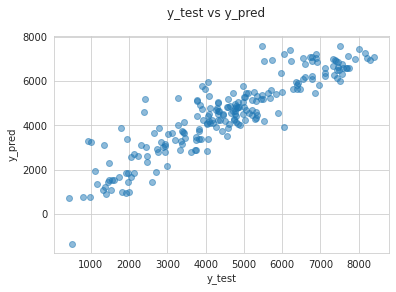

In [157]:
# plotting y_test and y_pred from total model to understand the spread
fig = plt.figure()
plt.scatter(result["cnt"], result["cnt_pred"],alpha = 0.5)
fig.suptitle('y_test vs y_pred')             
plt.xlabel('y_test')                          
plt.ylabel('y_pred') 

Text(0, 0.5, 'y_pred')

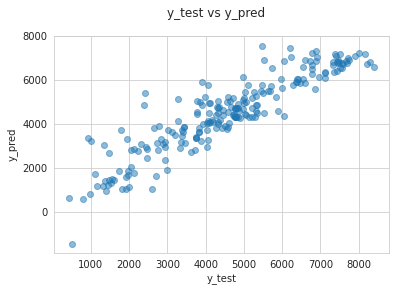

In [158]:
# plotting y_test and y_pred from combining cas and reg model to understand the spread
fig = plt.figure()
plt.scatter(result["cnt"], result["cnt_pred_combi"],alpha = 0.5)
fig.suptitle('y_test vs y_pred')             
plt.xlabel('y_test')                          
plt.ylabel('y_pred') 

In [159]:
r2 = round(r2_score(result["cnt"], result["cnt_pred"]),4)
print("The r-squared for total bike rental model:", r2)

r2_combined = round(r2_score(result["cnt"], result["cnt_pred_combi"]),4)
print("The r-squared for casual + registered bike rental models combined:", r2_combined)

The r-squared for total bike rental model: 0.817
The r-squared for casual + registered bike rental models combined: 0.8263


In [160]:
MAE = round(mean_absolute_error(result["cnt"], result["cnt_pred"]),4)
print("The mean abs error for total bike rental model:", MAE)
MAE_combined = round(mean_absolute_error(result["cnt"], result["cnt_pred_combi"]),4)
print("The mean abs error for casual + registered bike rental models combined:", MAE_combined)

The mean abs error for total bike rental model: 613.5734
The mean abs error for casual + registered bike rental models combined: 592.3792


In [161]:
RMSE = round(math.sqrt(mean_squared_error(result["cnt"], result["cnt_pred"])),4)
print("The root mean sq. error for total bike rental model:", RMSE)
RMSE_combined = round(math.sqrt(mean_squared_error(result["cnt"], result["cnt_pred_combi"])),4)
print("The root mean sq error for casual + registered bike rental models combined:", RMSE_combined)

The root mean sq. error for total bike rental model: 810.2901
The root mean sq error for casual + registered bike rental models combined: 789.5576


The two models produced comparable results. Seggregating casual and registered counts only slightly improved the explained variance and slightly reduced the error. So, we can consider the total count model.

In [166]:
print("Coefficients for total model:", lm_total_final.params)


print("Coefficients for total model:", lm_cas_final.params)


print("Coefficients for total model:", lm_reg_final.params)

Coefficients for total model: const        0.255404
atemp        0.448839
windspeed   -0.132338
2019         0.235023
spring      -0.125047
winter       0.028346
July        -0.054248
March        0.040227
May          0.030116
October      0.041267
September    0.078130
pattern_2   -0.083380
pattern_3   -0.288934
dtype: float64
Coefficients for total model: const        0.349108
hum         -0.122161
windspeed   -0.196319
2019         0.094141
spring      -0.092634
August       0.029272
December    -0.193414
February    -0.143430
January     -0.184008
July         0.025102
June         0.047390
November    -0.137362
Weekend      0.243594
pattern_3   -0.146433
dtype: float64
Coefficients for total model: const        0.307716
atemp        0.359896
windspeed   -0.110628
2019         0.258043
spring      -0.101117
winter       0.076408
June         0.040216
March        0.027696
May          0.040706
October      0.014461
September    0.089907
Weekend     -0.135305
pattern_2   -0.076193


# **5. Conclusion:**

1. The model equation is given by:

total count = 0.255404 + 0.448839 x atemp - 0.132338 x windspeed + 0.235023 x year_2019 - 0.125047 x spring + 0.028346 x winter + 0.040227 x March + 0.030116 x May - 0.054248 x July + 0.078130 x September + 0.041267 x October - 0.083380 x weather_pattern 2 - 0.288934 x weather_pattern_3

2. The following variables are significant in predicting the demands for the bike sharing:

a. 'atemp', 

b. 'windspeed',     

c. 'year',    

d. 'season',   

e. 'mnth',

f. 'weathersit'.

3. The model explains about 82% of the total variance of bike sharing counts. I have observed similar r squared values in training and training sets, implying that the model is well generalized. 

More detailed explanations are given related to variable effect and detailed finding in the responses to subjective questions.